# <center>Airbnb Listings Bangkok Neighbourhoods alongside Chao Praya River or NOT</center>
---
<center> Muhammad Difagama Ivanka </center><br>

<img src="https://logodix.com/logo/6364.png" alt="airbnb_logo" class="center">

# 1. Background of the Problem & The Goals

## Background Story

Bangkok's Chao Phraya River is a major center of the city's development process. Starting from the transportation aspect, the division of several areas, to the residences in the range of its edge. Airbnb as one of the online marketplaces for lodging is one that has a number of listings in Bangkok. As Airbnb, of course, wants an increase in the number of existing listings to be up to 15% more than the previous year. In order to get a more in-depth analysis process and where the potential lies, a comparison process of listings alongside the Chao Phraya river with those that are not (other than) is carried out. Later it might be seen with the position of strategies to several landmarks from tourism, as well as public places (eg transportation), alongside the **Chao Phraya River** whether it has a number of interesting facts if the comparison is made. The end result will show the need for additional listing in which area.

## Business Problem

As The Chao Phraya River, also known as the "The River of Kings", weaves through the heart of Thailand (Bangkok), its waters whispering stories of ancient civilizations, trade routes, and cultural exchange. There is a need to be addressing if the Listings located near this place would have a better prospect that could lead more tourism **come into Bangkok, Thailand**. There are several iconic landmarks located near the river such as the Grand Palace, Wat Arun Temple, Wat Phra Khaew and a series of luxury hotels and skyscrapers. The Chao Phraya River also supports a significant aquatic ecosystem and has a bustling life along its banks with local markets, residential areas, and piers for river taxis and tourist boats. The river plays a transformative role in Thai cultural and daily life, being the venue for festivals like Loy Krathong and an essential source of water for agricultural use. [source](https://travelsetu.com/guide/chao-phraya-river-tourism#:~:text=The%20riverbanks%20are%20adorned%20with%20iconic%20landmarks%2C%20including,and%20piers%20for%20river%20taxis%20and%20tourist%20boats.)

## Goals

* Analyze the Listings inside Neighbourhoods located alongside Chao Phraya River.
* Assessing some information that could derive a relationship between the placement of Listings and the other variables (features).

## Limitations

* It would not analyze in-depth for the area not alongside Chao Phraya River.
* Not included analysis according to some landmarks or attractions.

# 2. Data Understanding

[<small>Source Dataset of AirBnB Listings Bangkok</small>](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF) <br>
<small><sub>(Please do not forget to download it first!)</sub></small>

## Data Dictionary

<small>

| # | Features | Description |
| --- | --- | --- |
| 1 | id | Airbnb's unique identifier for the listing |
| 2 | name | Name of the listing |
| 3 | host_id | Airbnb's unique identifier for the host/user |
| 4 | host_name | Name of the host. Usually, just the first name(s). |
| 5 | neighborhood | The neighborhood is geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles |
| 6 | latitude | A measurement of location north or south of the Equator, and is approximately the angle between the equatorial plane and the normal from the ground at that location. Lines of latitude run parallel to the Equator. Uses the World Geodetic System (WGS84) projection for latitude, based on an oblate spheroid earth shape and a reference meridian that is slightly east of the Greenwich meridian. WGS84 coordinates are usually expressed in decimal degrees, with north and east positive. |
| 7 | longitude | Similar measurement as Latitude but on east or west of the Greenwich meridian. Lines of longitude run from the top of the Earth to the bottom. Uses the World Geodetic System (WGS84) projection for longitude, based on an oblate spheroid earth shape and a reference meridian that is slightly east of the Greenwich meridian. WGS84 coordinates are usually expressed in decimal degrees, with north and east positive. |
| 8 | room_type | [Entire home/apt, Private room , Shared room, Hotel] <br> <br> 1. Entire place: The best if you're seeking a home away from home. With an entire place, you'll have the whole space to yourself. This usually includes a bedroom, a bathroom, a kitchen, and a separate, dedicated entrance. Hosts should note in the description if they'll be on the property or not (ex: "Host occupies the first floor of the home") and provide further details on the listing. <br> 2. Private rooms: Great for when you prefer a little privacy, and still value a local connection. When you book a private room, you'll have your private room for sleeping and may share some spaces with others. You might need to walk through indoor spaces that another host or guest may occupy to get to your room. <br> 3. Shared rooms: For when you don't mind sharing a space with others. When you book a shared room, you'll be sleeping in a space that is shared with others and share the entire space with other people. Shared rooms are popular among flexible travelers looking for new friends and budget-friendly stays. <br> 4. Hotel rooms: This is a private room in a hotel or similar establishment |
| 9 | price | Daily price in local currency (baht). Note, the $ sign may be used despite the locale |
| 10 | minimum_nights | The minimum number of night stays for the listing (calendar rules may differ) |
| 11 | number_of_reviews | The number of reviews the listing has |
| 12 | last_review | The date of the last/newest review |
| 13 | calculated_host_listings_count | The number of listings the host has in the current scrape in the city/region geography |
| 14 | availability_365 | The calendar determines the availability of the listing x days in the future. Note a listing may be available because it has been booked by a guest or blocked by the host, for example 365, so it means the listing available for 1 year |
| 15 | number_of_reviews_ltm | The number of reviews the listing has (in the last 12 months) |

</small>

## Data Preview

In [1]:
# Importing necessary packages

# Fixing random state for reproducibility
import numpy as np
np.random.seed(123)
import pandas as pd

# Library for the graphs (also set styles of them)
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

plt.style.use('ggplot')
sns.set_style('darkgrid', {'grid.background': 'blue'})

# Graph of Geography
import geopandas as gpd
import contextily as ctx
from geodatasets import get_path
from shapely.geometry import Point

In [2]:
# Open and Show 7 first row of the AirBnB data as Pandas Dataframe, skip one unnecessary feature (unnamed: 0)

airbnb = pd.read_csv('Airbnb Listings Bangkok.csv').iloc[:, 1:]
airbnb.head(7)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0
5,1704776,NEw Pro!! Bungalow Bkk Centre,2129668,Wimonpak,Bang Kho laen,13.69757,100.52880,Entire home/apt,1000,250,19,2017-08-03,0.17,41,365,0
6,48736,Condo with Chaopraya River View,222005,Athitaya,Rat Burana,13.68556,100.49535,Private room,1558,3,1,2014-02-03,0.01,1,365,0


## General Information

In [3]:
# Number of rows and features

print(f'AirBnB Rows Count\t\t: {len(airbnb)} rows')
print(f'AirBnB Features Count\t\t: {len(airbnb.columns)} features')
print(f'Number of Listing Unique IDs\'\t: {airbnb.id.nunique()} unique ids')

AirBnB Rows Count		: 15854 rows
AirBnB Features Count		: 16 features
Number of Listing Unique IDs'	: 15854 unique ids


In [4]:
# General info for the AirBnB's Dataframe (datatype of each feature, total feature count without null values, etc)

airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15854 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15854 non-null  int64  
 3   host_name                       15853 non-null  object 
 4   neighbourhood                   15854 non-null  object 
 5   latitude                        15854 non-null  float64
 6   longitude                       15854 non-null  float64
 7   room_type                       15854 non-null  object 
 8   price                           15854 non-null  int64  
 9   minimum_nights                  15854 non-null  int64  
 10  number_of_reviews               15854 non-null  int64  
 11  last_review                     10064 non-null  object 
 12  reviews_per_month               

## Descriptive Statistics

In [5]:
# Descriptive Statistics Summary for Numerical Features (exclude id features, because it more of nominal/categorical)

airbnb.iloc[:, 3:].describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,15854.0,13.745144,0.043040,13.52730,13.72009,13.738490,13.759497,1.395354e+01
longitude,15854.0,100.559903,0.050911,100.32955,100.52969,100.561415,100.585150,1.009234e+02
price,15854.0,3217.703923,24972.122358,0.00000,900.00000,1429.000000,2429.000000,1.100000e+06
minimum_nights,15854.0,15.292355,50.815020,1.00000,1.00000,1.000000,7.000000,1.125000e+03
number_of_reviews,15854.0,16.654157,40.613331,0.00000,0.00000,2.000000,13.000000,1.224000e+03
reviews_per_month,10064.0,0.813145,1.090196,0.01000,0.12000,0.435000,1.060000,1.913000e+01
calculated_host_listings_count,15854.0,13.889618,30.269848,1.00000,1.00000,4.000000,13.000000,2.280000e+02
availability_365,15854.0,244.378643,125.843224,0.00000,138.00000,309.000000,360.000000,3.650000e+02
number_of_reviews_ltm,15854.0,3.481519,8.916937,0.00000,0.00000,0.000000,3.000000,3.250000e+02


> It seems no quite anomaly from this information, like negative point for something that should be have minimum value of 0. One thing that needs to be care more later on, is the `price` feature because of its to big value of standard deviation. On `price` feature, the mean value is ฿3.217,703923 converted to IDR (as for today exchange rate: ฿1,00 is around Rp444,32) that is about Rp1.429.699,86 (1.4 millions IDR); and for the maximum value is ฿1.100.000,00 that is about Rp488.755.300,00 (488.7 millions IDR) this is very expensive amount a listing might have, only for a night! - interesting.

In [6]:
# Descriptive Statistics Summary for Categorical Features (host_id the same as host_name, id same as name)

airbnb.describe(include='O').T

,count,unique,top,freq
name,15846,14794,New! La Chada Night Market studio 2PPL near MRT,45
host_name,15853,5312,Curry,228
neighbourhood,15854,50,Vadhana,2153
room_type,15854,4,Entire home/apt,8912
last_review,10064,1669,2022-12-11,189


> From the categorical features itself, along with their unique value count, there are also informations like, the top value appeared/contained (highest frequency).

In [7]:
# column list

airbnb.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'],
      dtype='object')

## Possible Outliers

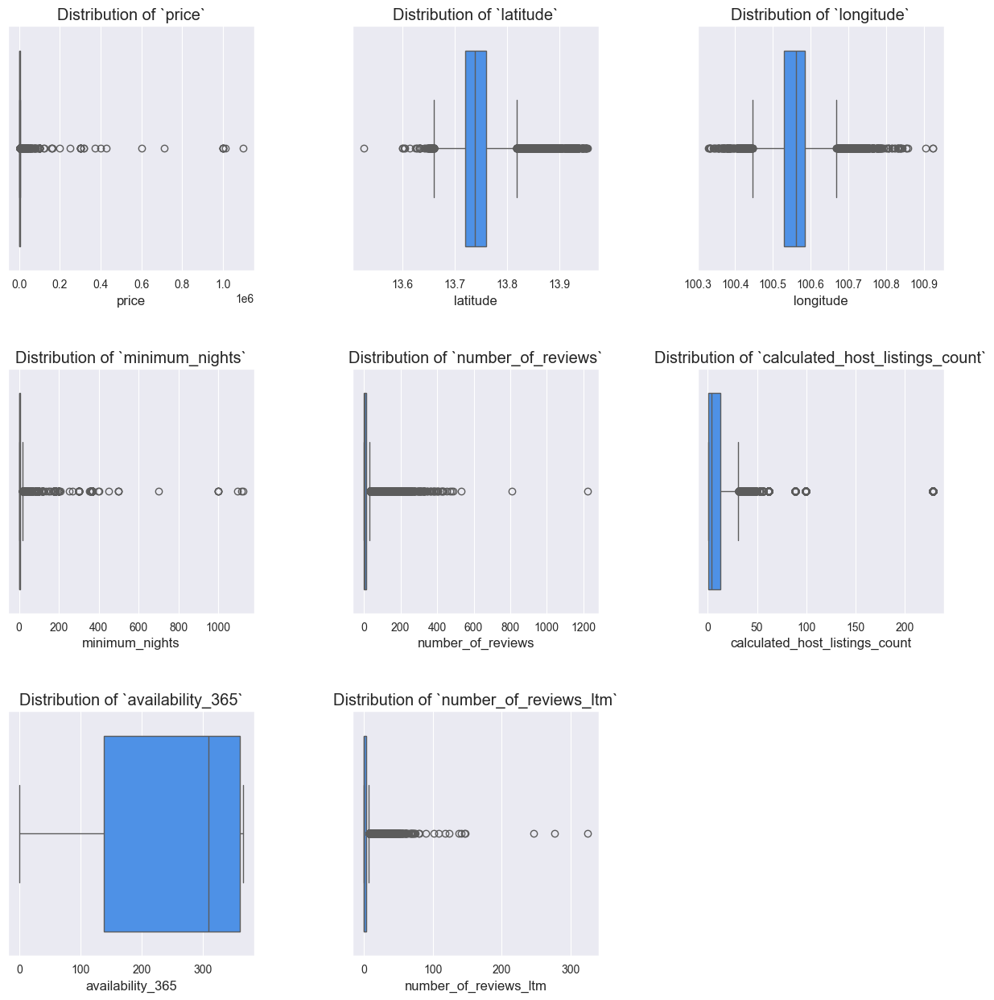

In [8]:
# Potential Outliers on Numerical Features
# Setting up the figure and axes
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# List of features to plot
numerical_feats = [
    'price',
    'latitude',
    'longitude',
    'minimum_nights',
    'number_of_reviews',
    'calculated_host_listings_count',
    'availability_365',
    'number_of_reviews_ltm'
    ]

# Plotting each feature in the respective subplot
for ax, feature in zip(axes.flatten(), numerical_feats):
    if feature == 'room_type':
        sns.boxplot(x=airbnb[feature], y=airbnb['price'], ax=ax)
        ax.set_title(f'Price by {feature}')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    else:
        sns.boxplot(x=airbnb[feature], ax=ax, orient='horizontal', color='#358EFF')
        ax.set_title(f'Distribution of `{feature}`')

# Removing any unused subplots (if any)
for i in range(len(numerical_feats), 9):
    fig.delaxes(axes.flatten()[i])

plt.show()

> Based on these box & whiskers charts, several features really right-skewed + contains possible outliers (price, minimum_nights, number_of_reviews, calculated_host_listings_count, number_of_reviews_ltm), one feature look left-skewed without possible outliers point detected (availability_365), and for latitude, longitude almost not skewed + also contains possible outliers (but possibly will be kept as a valid coordinate for geo-location).

In [9]:
# Outliers Candidate percentage

outliers_candidate = dict()

def outliers_check(df, feature_name):
    Q3 = df[feature_name].quantile(.75)
    Q1 = df[feature_name].quantile(.25)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5*IQR
    lower_bound = Q1 - 1.5*IQR
    outliers_df = df[(df[feature_name] > upper_bound) | (df[feature_name] < lower_bound)]
    return outliers_df

for k in numerical_feats:
    outliers_df = outliers_check(airbnb, k)
    outliers_candidate[k] = len(outliers_df)

outliers_candidate_df = pd.DataFrame(outliers_candidate, index=['-']).T.reset_index()
outliers_candidate_df.columns = ['Features', 'Outliers Count']
outliers_candidate_df['Outliers Percentage (%)'] = round(outliers_candidate_df['Outliers Count'] / len(airbnb) * 100, 3)
outliers_candidate_df.sort_values(by='Outliers Percentage (%)', ascending=False, ignore_index=True)

,Features,Outliers Count,Outliers Percentage (%)
0,minimum_nights,3168,19.982
1,number_of_reviews,2240,14.129
2,number_of_reviews_ltm,2219,13.996
3,calculated_host_listings_count,1832,11.555
4,price,1403,8.850
5,latitude,1095,6.907
6,longitude,602,3.797
7,availability_365,0,0.000


> But overall all of these possible values would be kept, because there is no evidence to prove that unusual values on the features, not exactly real value (extracted from the platform) or is it wrong input etc. It just that for the analysis part would be using robust method of statistics like instead of mean -> median.

In [10]:
# Removal (not needed)

price_out = outliers_check(airbnb, 'price')
price_cl = airbnb.drop(price_out.index)

night_out = outliers_check(price_cl, 'minimum_nights')
night_cl = price_cl.drop(night_out.index)

rev_cnt = outliers_check(night_cl, 'number_of_reviews')
rev_cl = night_cl.drop(rev_cnt.index)

revltm_out = outliers_check(rev_cl, 'minimum_nights')

no_out = rev_cl.drop(revltm_out.index)

## Correlation Matrix

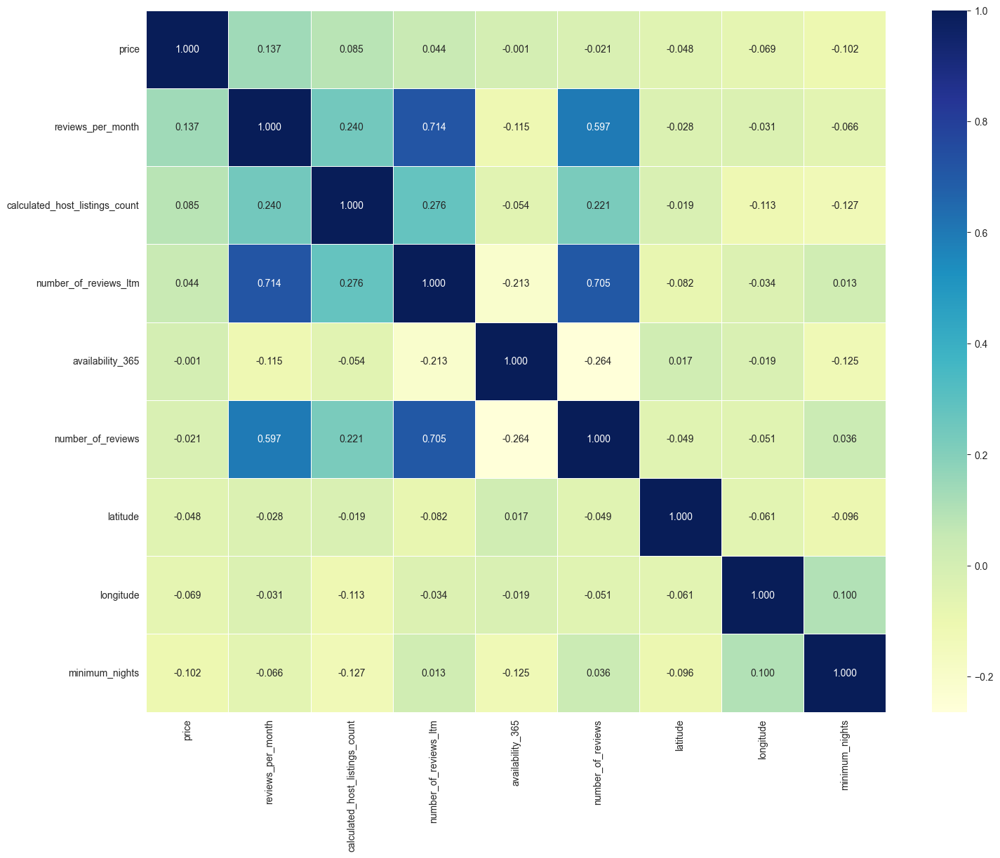

In [12]:
# check whether it might be there is some correlation between features (using spearman method because the distribution not normal)

numerical_feats = ['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
                   'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']
corr_matrix = airbnb[numerical_feats].corr(method='spearman')

plt.figure(figsize=(17,13))
sns.heatmap(corr_matrix.sort_values(by='price', ascending=False).sort_values(by='price', ascending=False, axis=1), 
            cmap='YlGnBu', annot=True, linewidths= .5, fmt='.3f');

# corr_matrix['Price'].sort_values(ascending=False);

> From this correlation spearman method, clearly seen that there are 3 features have quite significant correlation with each other namely: `reviews_per_month`, `number_of_reviews_ltm`, and `number_of_reviews`. These are expected, like if one of these features increase, it might affect the other ones to be increased, too.

# 3. Data Cleansing

## Missing Values Imputation

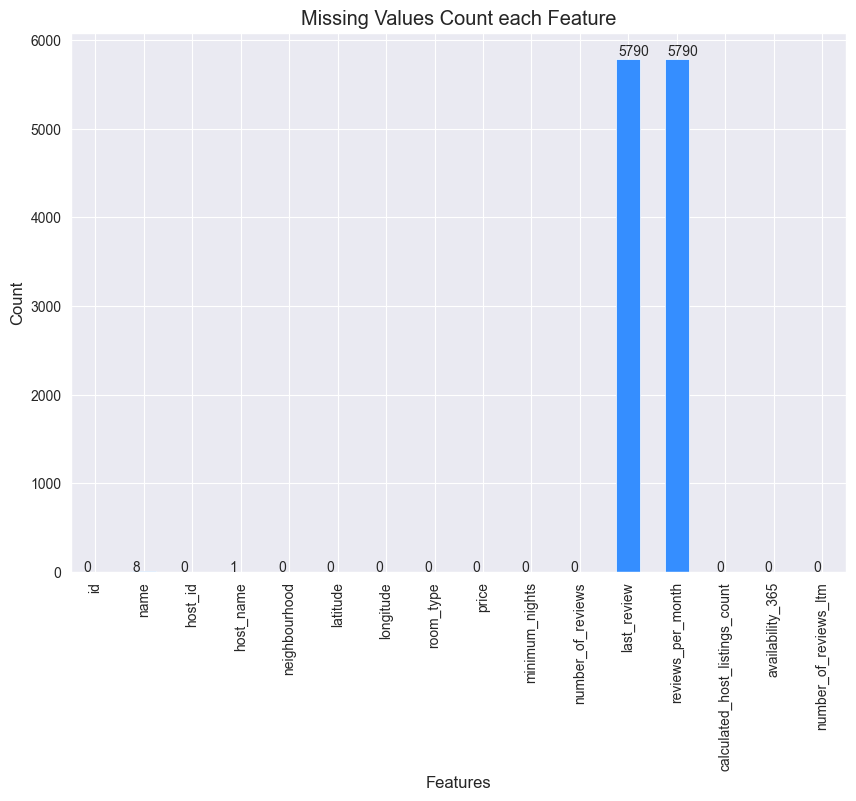

In [243]:
# NA or NULL values count

ax = airbnb.isna().sum().plot.bar(
    figsize = (10, 7),
    title = 'Missing Values Count each Feature',
    xlabel = 'Features',
    ylabel = 'Count',
    color = '#358EFF'
)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005));

In [244]:
# Percentage of missing values

missing_cnt = airbnb.isna().sum()
missing_cols = airbnb.columns[missing_cnt > 0]

missing_df = pd.DataFrame(airbnb[missing_cols].isna().sum())
missing_df['missing_percentage'] = airbnb[missing_cols].isna().sum().values / airbnb.shape[0] * 100
missing_df['missing_percentage'] = missing_df['missing_percentage'].apply(lambda x: round(float(x), 3))
missing_df.columns = ['missing_count', 'missing_percentage (%)']

missing_df = missing_df.sort_values(by='missing_count', ascending=False)
missing_df

,missing_count,missing_percentage (%)
last_review,5790,36.521
reviews_per_month,5790,36.521
name,8,0.050
host_name,1,0.006


In [13]:
# copy the original dataframe to other variable for the rest of cleansing process

airbnb_cleaned = airbnb.copy()

In [14]:
# the one and only host_name missing value (would be derived from its `host_id` value)

airbnb_cleaned[airbnb_cleaned['host_name'].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


In [15]:
# Listings without name (would also be derrived from `id` feature)

airbnb_cleaned[airbnb_cleaned['name'].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaN,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaN,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaN,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaN,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaN,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaN,NaN,1,365,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


In [16]:
# `last_review` (fill with Unknown, because not known last date or even there is no at all)
# host_name, name as stated before, because we need to extract some valuable insight here
# as for reviews_per_month we will remove it this whole feature later

airbnb_cleaned['last_review'] = airbnb_cleaned['last_review'].fillna('Unknown')
airbnb_cleaned['host_name'] = airbnb_cleaned['host_name'].fillna(airbnb['host_id'].apply(lambda x: 'host_' + str(x)))
airbnb_cleaned['name'] = airbnb_cleaned['name'].fillna(airbnb['id'].apply(lambda x: 'name_' + str(x)))
airbnb_cleaned.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                          0
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

## Duplicate Values Combined (especially the host name)

In [17]:
# Duplicate dataframe: the one that already keep 1 row (no orig) and the other which listed all the duplicates (with orig)
duplicate_df_no_orig = airbnb[
    airbnb.duplicated(subset=['name', 'host_id', 'neighbourhood', 'room_type', 'latitude', 'longitude'])
    ].sort_values(by=['name', 'host_id', 'reviews_per_month', 'host_name'])
duplicate_df_with_orig = airbnb[
    airbnb.duplicated(subset=['name', 'host_id', 'neighbourhood', 'room_type', 'latitude', 'longitude'], keep=False)
    ].sort_values(by=['name', 'host_id', 'reviews_per_month', 'host_name'])

print(
    'Duplicate Rows: ',
    len(duplicate_df_no_orig)
)

Duplicate Rows:  53


In [250]:
# Example of the same or updated `host_name`
airbnb[(airbnb.host_name == 'MeetU') | (airbnb.host_name == 'TTzahome')].iloc[:2, :]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
14805,749934710136320748,曼谷市中心酒店式公寓/近BTS，毗邻曼谷河滨！美食街 帕蓬夜市14分钟可达/WIFI/游泳池免费,227771817,MeetU,Sathon,13.711027,100.519891,Entire home/apt,1091,1,1,2022-11-18,0.73,6,340,1
14806,749967082827376832,"曼谷市中心高端公寓/近BTS/游泳池/健身房,近BTS,免费高速WIFI,帕蓬夜市14分钟可达",219984842,TTzahome,Sathon,13.711027,100.519891,Entire home/apt,1120,1,0,NaN,NaN,5,340,0


In [251]:
# One sample based on several feature duplication

duplicate_df_with_orig[duplicate_df_with_orig.name == '15days!New!Bang Phlat MRT 600m/swiming pool/gym']

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15140,767854746382894709,15days!New!Bang Phlat MRT 600m/swiming pool/gym,52161947,Noons,Bang Phlat,13.788938,100.5036,Entire home/apt,885,15,0,NaN,NaN,99,320,0
15251,770020360658818433,15days!New!Bang Phlat MRT 600m/swiming pool/gym,52161947,Noons,Bang Phlat,13.788938,100.5036,Entire home/apt,708,15,0,NaN,NaN,99,323,0
14479,737304241187219763,15days!New!Bang Phlat MRT 600m/swiming pool/gym,201677068,Curry,Bang Phlat,13.788938,100.5036,Entire home/apt,883,15,1,2022-11-26,0.91,228,328,1
14429,727179198031873152,15days!New!Bang Phlat MRT 600m/swiming pool/gym,201677068,Curry,Bang Phlat,13.788938,100.5036,Entire home/apt,883,15,0,NaN,NaN,228,253,0


In [18]:
# first will get the newest based on the id, last will get the one with last_review value

combined_dups = duplicate_df_no_orig.groupby(['name', 'neighbourhood', 'room_type', 'latitude', 'longitude']).agg({
    'id': 'last',
    'name': 'last',
    'host_id': 'last',
    'host_name': 'last',
    'neighbourhood': 'last',
    'latitude': 'last',
    'longitude': 'last',
    'room_type': 'last',
    'price': 'first',
    'minimum_nights': 'last',
    'number_of_reviews': 'last',
    'last_review': 'first',
    'reviews_per_month':'first',
    'calculated_host_listings_count': 'last',
    'availability_365': 'last',
    'number_of_reviews_ltm': 'last'
}).reset_index(drop=True)

combined_dups['last_review'] = combined_dups['last_review'].fillna('Unknown')
combined_dups

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,737304241187219763,15days!New!Bang Phlat MRT 600m/swiming pool/gym,201677068,Curry,Bang Phlat,13.788938,100.503600,Entire home/apt,708,15,1,2022-11-26,0.91,228,328,1
1,787296571117687159,2 Beds Thong lor/Ekkamai/Nana/Swimming pool,485413319,Yang,Khlong Toei,13.722669,100.576863,Entire home/apt,2304,1,0,Unknown,NaN,4,356,0
2,711118986202155661,30days! Sukhumvit NANA spacious 2BR 4PPL near BTS,201677068,Curry,Ratchathewi,13.750300,100.555503,Entire home/apt,4193,2,1,2022-11-17,0.71,228,347,1
3,767061827877321023,"50m MRT, Big C, 1 BR condo with Sauna, Pool & Gym",472715937,Kotcharat,Bang Sue,13.828505,100.527433,Entire home/apt,560,12,0,Unknown,NaN,8,329,0
4,789484901156712444,"50m MRT, Big C, 1 BR condo with Sauna, Pool & Gym",472715937,Kotcharat,Bang Sue,13.828505,100.527433,Entire home/apt,560,12,0,Unknown,NaN,8,363,0
5,746661477647888634,Budget Hotel in Center of Bangkok @HAP,476157531,Tachin,Sathon,13.720197,100.548159,Private room,1245,1,0,Unknown,NaN,4,364,0
6,33558863,Cozy Room/Private/(2pp)/BTS7Min/Silom/Sathorn/New,60049967,Note,Bang Rak,13.723330,100.523310,Hotel room,1839,1,13,2020-03-31,0.30,8,328,0
7,37802487,"DOUBLE AIRPORT 10MIN, NICE VIEW ROOFTOP",273701410,Jirayu,Lat Krabang,13.719430,100.753990,Hotel room,633,1,74,2022-12-25,1.83,4,338,32
8,30979633,Family Friendly Condo with Baby amenities提供婴儿床,12464021,Rebecca,Huai Khwang,13.760440,100.569440,Entire home/apt,2310,3,105,2022-12-18,2.17,21,140,13
9,790280473547745220,Family Room for 4 People,340188343,Rachan,Vadhana,13.740168,100.556320,Private room,2237,1,0,Unknown,NaN,14,360,0


In [19]:
# Removing the original duplicates from the dataset and adding the combined rows based on its host before

airbnb_cleaned = pd.concat([airbnb_cleaned.drop(duplicate_df_with_orig.index), combined_dups], axis=0).reset_index(drop=True)
airbnb_cleaned

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,Unknown,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,Unknown,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,Unknown,NaN,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15791,37572967,Vintage LOFT SUITE in Bangkok old town,214236911,Jason,Phra Nakhon,13.757000,100.504680,Hotel room,4800,1,0,Unknown,NaN,6,310,0
15792,35863482,White House Hostel Deluxe Room Shared Bathroom,266898220,Piti,Ratchathewi,13.753400,100.538220,Hotel room,786,1,8,2022-12-07,0.19,17,333,3
15793,37954129,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,Unknown,NaN,4,180,0
15794,785799200036904329,"曼谷市中心loft公寓/近BTS/游泳池/健身房,近BTS,免费高速WIFI,帕蓬夜市14分钟可达",219984842,TTzahome,Sathon,13.710777,100.519891,Entire home/apt,1285,1,0,Unknown,NaN,5,342,0


## New Feature Creation (last review year)

In [20]:
# Extract only the year, because that what needed!

airbnb_cleaned['last_review_year'] = airbnb_cleaned['last_review'].str.split('-').str[0]
airbnb_cleaned['last_review_year'] = np.where(airbnb_cleaned['last_review_year'].str == 'None', 'Unknown', airbnb_cleaned['last_review_year'])
airbnb_cleaned['last_review_year'].value_counts()

last_review_year
2022       6605
Unknown    5761
2020       1247
2019       1009
2018        484
2017        268
2021        206
2016        149
2015         50
2014          9
2013          7
2012          1
Name: count, dtype: int64

In [255]:
airbnb_cleaned.groupby('last_review_year')['number_of_reviews'].sum().sort_index().reset_index()

,last_review_year,number_of_reviews
0,2012,4
1,2013,30
2,2014,16
3,2015,182
4,2016,852
5,2017,1406
6,2018,3978
7,2019,10611
8,2020,31329
9,2021,4088


In [256]:
last_rev_yr = airbnb_cleaned['last_review_year'].value_counts().sort_index()
last_rev_yr = last_rev_yr.drop('Unknown').reset_index()

# Calculate the growth percentage
last_rev_yr['growth_%_from_1_year_before'] = last_rev_yr['count'].pct_change() * 100

# Replace NaN values (resulting from pct_change) with 0%
last_rev_yr['growth_%_from_1_year_before'] = last_rev_yr['growth_%_from_1_year_before'].fillna(0)

last_rev_yr

,last_review_year,count,growth_%_from_1_year_before
0,2012,1,0.000000
1,2013,7,600.000000
2,2014,9,28.571429
3,2015,50,455.555556
4,2016,149,198.000000
5,2017,268,79.865772
6,2018,484,80.597015
7,2019,1009,108.471074
8,2020,1247,23.587711
9,2021,206,-83.480353


In [257]:
last_rev_yr['growth_%_from_1_year_before'].iloc[1:].mean()

459.74788826139803

## Binning of `minimum_nights` Feature

In [258]:
# Show of how much nights

airbnb_cleaned['minimum_nights'].value_counts().reset_index()

,minimum_nights,count
0,1,8214
1,2,1727
2,30,1345
3,3,965
4,28,546
...,...,...
80,355,1
81,89,1
82,135,1
83,198,1


In [21]:
# Map the `minimum_nights` into new category name

def min_nights_cat(column):
    if column > 365:
        return '> 1 Year'
    elif column >= 180:
        return '6 Months - 1 Year'
    elif column >= 90:
        return '3 Months - 6 Months'
    elif column >= 30:
        return '1 Month - 3 Months'
    elif column >= 21:
        return '3 Weeks - 1 Month'
    elif column >= 14:
        return '2 Weeks - 3 Weeks'
    elif column >= 7:
        return '1 Weeks - 2 Weeks'
    elif column == 1:
        return '1 Night'
    return str(column) + ' ' + 'Nights'

airbnb_cleaned['minimum_nights'] = airbnb_cleaned['minimum_nights'].apply(min_nights_cat)
airbnb_cleaned['minimum_nights'].value_counts()

minimum_nights
1 Night                8214
2 Nights               1727
1 Month - 3 Months     1560
3 Nights                965
3 Weeks - 1 Month       823
1 Weeks - 2 Weeks       685
2 Weeks - 3 Weeks       518
5 Nights                413
6 Months - 1 Year       374
3 Months - 6 Months     263
4 Nights                181
6 Nights                 58
> 1 Year                 15
Name: count, dtype: int64

In [22]:
airbnb_cleaned['minimum_nights'].value_counts(normalize=True) * 100

minimum_nights
1 Night                52.000506
2 Nights               10.933148
1 Month - 3 Months      9.875918
3 Nights                6.109142
3 Weeks - 1 Month       5.210180
1 Weeks - 2 Weeks       4.336541
2 Weeks - 3 Weeks       3.279311
5 Nights                2.614586
6 Months - 1 Year       2.367688
3 Months - 6 Months     1.664978
4 Nights                1.145860
6 Nights                0.367182
> 1 Year                0.094961
Name: proportion, dtype: float64

> Interesting of how the Listings that set their `minimum_nights` to 6 nights had a very little amount, compared to 4, 5, or even 1 weeks+. <br>
From this also, half of the listings' `minimum_nights` to only 1 Night (around 52%)!

## Binning of `availability_365` Feature

In [23]:
# Show of how much availability into the future (in days)

airbnb_cleaned['availability_365'].value_counts().reset_index()

,availability_365,count
0,365,2390
1,0,856
2,364,672
3,180,436
4,90,334
...,...,...
361,183,2
362,20,2
363,193,1
364,197,1


In [24]:
# Map the `availability_365` into new category name

def availability_365_cat(column):
    if column == 365:
        return '1 Year'
    elif column >= 330:
        return '11 Months - 1 Year'
    elif column >= 300:
        return '10 Months - 11 Months'
    elif column >= 180:
        return '6 Months - 10 Months'
    elif column >= 90:
        return '3 Months - 6 Months'
    elif column >= 30:
        return '1 Month - 3 Months'
    elif column >= 21:
        return '3 Weeks - 1 Month'
    elif column >= 14:
        return '2 Weeks - 3 Weeks'
    elif column >= 2:
        return '2 Days - 2 Weeks'
    elif column == 1:
        return '1 Day'

# airbnb_cleaned['availability_365'].apply(availability_365_cat).value_counts()
airbnb_cleaned['availability_365'] = airbnb_cleaned['availability_365'].apply(availability_365_cat)
airbnb_cleaned['availability_365'].value_counts()

availability_365
11 Months - 1 Year       4653
3 Months - 6 Months      2886
1 Year                   2390
6 Months - 10 Months     1837
1 Month - 3 Months       1709
10 Months - 11 Months    1193
3 Weeks - 1 Month         107
2 Days - 2 Weeks           82
1 Day                      47
2 Weeks - 3 Weeks          36
Name: count, dtype: int64

In [25]:
airbnb_cleaned['availability_365'].value_counts(normalize=True) * 100

availability_365
11 Months - 1 Year       31.144578
3 Months - 6 Months      19.317269
1 Year                   15.997323
6 Months - 10 Months     12.295850
1 Month - 3 Months       11.439090
10 Months - 11 Months     7.985274
3 Weeks - 1 Month         0.716198
2 Days - 2 Weeks          0.548862
1 Day                     0.314592
2 Weeks - 3 Weeks         0.240964
Name: proportion, dtype: float64

> Interesting of how there are several Listings that would be available only after 1 year (around 15%-30% of total data).

## Remove Unneeded Features

In [26]:
# we do not need this features, thus just remove it, some already duplicated (like ids')
airbnb_cleaned = airbnb_cleaned.drop([
    'id', 'host_id',
    'reviews_per_month',
    'last_review',
    'number_of_reviews_ltm',
    'calculated_host_listings_count'
], axis=1)

airbnb_cleaned.columns

Index(['name', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'availability_365', 'last_review_year'],
      dtype='object')

## Capitalize Each First Word of Neighbourhood

In [27]:
# Check if there are values on `neighbourhood` feature using small case

airbnb[~(airbnb['neighbourhood'].str.istitle())]['neighbourhood'].unique()

array(['Bang Kho laen', 'Thon buri', 'Yan na wa', 'Thung khru',
       'Bang Khun thain'], dtype=object)

In [28]:
# Apply the naming fix

airbnb_cleaned['neighbourhood'] = airbnb_cleaned['neighbourhood'].str.title()
airbnb_cleaned['neighbourhood'] = airbnb_cleaned['neighbourhood'].apply(lambda x: 'Bang Kho Laem' if x == 'Bang Kho Laen' else x)
airbnb_cleaned['neighbourhood'].unique()

array(['Ratchathewi', 'Bang Na', 'Bang Kapi', 'Din Daeng',
       'Bang Kho Laem', 'Rat Burana', 'Chatu Chak', 'Khlong San',
       'Bang Rak', 'Phaya Thai', 'Sathon', 'Khlong Toei', 'Vadhana',
       'Sai Mai', 'Lat Krabang', 'Bangkok Yai', 'Wang Thong Lang',
       'Huai Khwang', 'Phasi Charoen', 'Bang Sue', 'Nong Chok',
       'Phra Khanong', 'Thawi Watthana', 'Parthum Wan', 'Pra Wet',
       'Phra Nakhon', 'Thon Buri', 'Yan Na Wa', 'Suanluang', 'Don Mueang',
       'Dusit', 'Lak Si', 'Samphanthawong', 'Bueng Kum', 'Bang Phlat',
       'Saphan Sung', 'Min Buri', 'Khan Na Yao', 'Khlong Sam Wa',
       'Bang Khen', 'Lat Phrao', 'Chom Thong', 'Bangkok Noi',
       'Pom Prap Sattru Phai', 'Nong Khaem', 'Thung Khru', 'Bang Khae',
       'Bang Khun Thain', 'Taling Chan', 'Bang Bon'], dtype=object)

## 10 Landmarks Geo-Position in Bangkok

In [29]:
landmarks_dict = {
    'The Grand Palace Bangkok': (13.750300, 100.491180),
    'Wat Arun Temple': (13.7438652, 100.4858691),
    'Bang Kachao': (13.6949882, 100.5559791),
    'King Power Mahanakhon Skywalk': (13.7235375, 100.5256718),
    'Jim Thompson House': (13.7492491,100.5257341),
    # 'Damnoen Saduak floating market': (13.5201684,99.9560295),
    'The National Museum of Bangkok': (13.7580779,100.4891328),
    'ICONSIAM shopping complex': (13.7264814,100.5073721),
    'Wat Phra Kaew': (13.7512917,100.4888557),
    'Royal Barges National Museum': (13.761947,100.4820195),
    'Sea Life Bangkok Ocean World': (13.746799,100.5337196)
}

landmarks_df = pd.DataFrame(landmarks_dict).T.reset_index()
landmarks_df.columns = ['Landmark Name', 'Latitude', 'Longitude']
landmarks_df

,Landmark Name,Latitude,Longitude
0,The Grand Palace Bangkok,13.750300,100.491180
1,Wat Arun Temple,13.743865,100.485869
2,Bang Kachao,13.694988,100.555979
3,King Power Mahanakhon Skywalk,13.723538,100.525672
4,Jim Thompson House,13.749249,100.525734
5,The National Museum of Bangkok,13.758078,100.489133
6,ICONSIAM shopping complex,13.726481,100.507372
7,Wat Phra Kaew,13.751292,100.488856
8,Royal Barges National Museum,13.761947,100.482020
9,Sea Life Bangkok Ocean World,13.746799,100.533720


## Chao Praya River (Neighbourhoods Alongside it)

![50districtsbangkokwiki.png](https://upload.wikimedia.org/wikipedia/commons/thumb/d/d2/Khet_Bangkok.svg/660px-Khet_Bangkok.svg.png)

image source: [wikipedia](https://en.wikipedia.org/wiki/List_of_districts_of_Bangkok)

> Neighbourhoods along Chao Phraya River: <br><br>
Right Side: <br>
1: Phra Nakhon <br>
2: Dusit <br>
4: Bang Rak <br>
9: Phra Khanong <br>
12: Yan Nawa <br>
13: Samphanthawong <br>
28: Sathon <br>
29: Bang Sue <br>
31: Bang Kho Laem <br>
33: Khlong Toei <br>
47: Bang Na <br><br>
Left Side: <br>
15: Thon Buri <br>
16: Bangkok Yai <br>
18: Khlong San <br>
20: Bangkok Noi <br>
24: Rat Burana <br>
25: Bang Phlat

In [30]:
# List for neighbourhood that located alongside Chao Phraya river

neighbour_chao_phraya_right_side = (
    'Phra Nakhon',
    'Dusit',
    'Bang Rak',
    'Phra Khanong',
    'Yan Na Wa',
    'Samphanthawong',
    'Sathon',
    'Bang Sue',
    'Bang Kho Laem',
    'Khlong Toei',
    'Bang Na'
)

neighbour_chao_phraya_left_side = (
    'Thon Buri',
    'Bangkok Yai',
    'Khlong San',
    'Bangkok Noi',
    'Rat Burana',
    'Bang Phlat'
)

neighbour_chao_phraya_list = (
    'Phra Nakhon',
    'Dusit',
    'Bang Rak',
    'Phra Khanong',
    'Yan Na Wa',
    'Samphanthawong',
    'Thon Buri',
    'Bangkok Yai',
    'Khlong San',
    'Bangkok Noi',
    'Rat Burana',
    'Bang Phlat',
    'Sathon',
    'Bang Sue',
    'Bang Kho Laem',
    'Khlong Toei',
    'Bang Na'
)

print(f'Total Count of Neighbourhoods alongside Chao Phraya River\t: {len(neighbour_chao_phraya_list)}')
print(f'Total Count of Neighbourhoods along Right-side Chao Phraya River: {len(neighbour_chao_phraya_right_side)}')
print(f'Total Count of Neighbourhoods along Left-side Chao Phraya River\t: {len(neighbour_chao_phraya_left_side)}')

Total Count of Neighbourhoods alongside Chao Phraya River	: 17
Total Count of Neighbourhoods along Right-side Chao Phraya River: 11
Total Count of Neighbourhoods along Left-side Chao Phraya River	: 6


In [31]:
# Give the information for neighbourhood location categorization

airbnb_cleaned['chao_phraya_pos'] = airbnb_cleaned['neighbourhood'].apply(
    lambda x: 'Alongside Chao Phraya River' if x in neighbour_chao_phraya_list else 'NOT Alongside'
)

airbnb_cleaned['chao_phraya_side'] = airbnb_cleaned['neighbourhood'].apply(
    lambda x: 'Rightside Chao Phraya River' if x in neighbour_chao_phraya_right_side else (
        'Leftside Chao Phraya River' if x in neighbour_chao_phraya_left_side else 'NOT Alongside'
    )
)

display(
    airbnb_cleaned.chao_phraya_pos.value_counts(),
    airbnb_cleaned.chao_phraya_side.value_counts()
)

chao_phraya_pos
NOT Alongside                  8623
Alongside Chao Phraya River    7173
Name: count, dtype: int64

chao_phraya_side
NOT Alongside                  8623
Rightside Chao Phraya River    6125
Leftside Chao Phraya River     1048
Name: count, dtype: int64

## Saved the Clean Data

In [32]:
airbnb_cleaned.to_csv('airbnb_listings_bangkok_clean.csv', index=False)

# 4. Exploratory Data Analysis (EDA)

## Proportion of Neighbourhoods alongside Chao Phraya River vs NOT

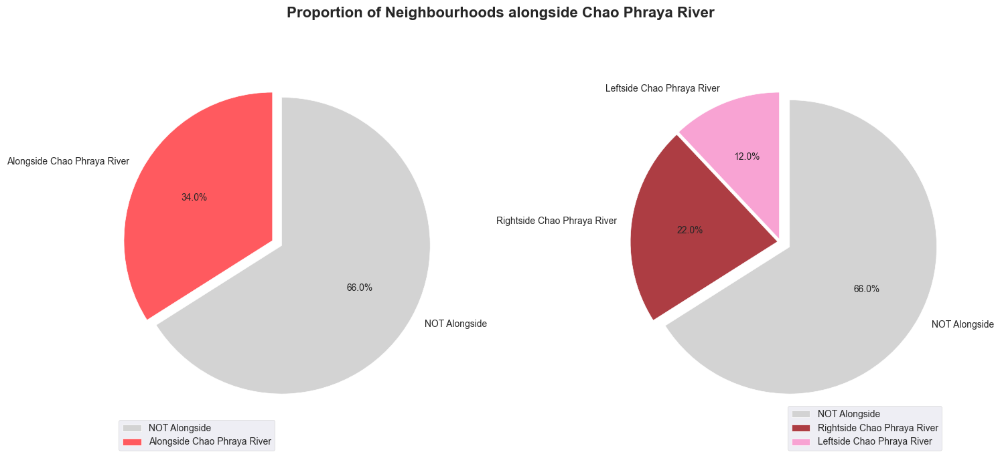

In [361]:
# Pie chart styling
# Position of Chao Phraya River
chao_phraya_groupby = airbnb_cleaned['chao_phraya_pos'].value_counts().reset_index()
# chao_phraya_groupby = airbnb_cleaned.groupby('chao_phraya_pos')['neighbourhood'].count().reset_index()
neighbour_not_cnt = airbnb_cleaned[airbnb_cleaned['chao_phraya_pos'] == 'NOT Alongside']['neighbourhood'].nunique()
neighbour_along_cnt = airbnb_cleaned[airbnb_cleaned['chao_phraya_pos'] == 'Alongside Chao Phraya River']['neighbourhood'].nunique()
chao_phraya_groupby.loc[chao_phraya_groupby['chao_phraya_pos'] == 'NOT Alongside', 'count'] = neighbour_not_cnt
chao_phraya_groupby.loc[chao_phraya_groupby['chao_phraya_pos'] == 'Alongside Chao Phraya River', 'count'] = neighbour_along_cnt

# Side of Chao Phraya River
chao_phraya_side_groupby = airbnb_cleaned['chao_phraya_side'].value_counts().reset_index()
# chao_phraya_groupby = airbnb_cleaned.groupby('chao_phraya_pos')['neighbourhood'].count().reset_index()
neighbour_not_cnt = airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'NOT Alongside']['neighbourhood'].nunique()
neighbour_left_cnt = airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'Leftside Chao Phraya River']['neighbourhood'].nunique()
neighbour_right_cnt = airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'Rightside Chao Phraya River']['neighbourhood'].nunique()
chao_phraya_side_groupby.loc[chao_phraya_side_groupby['chao_phraya_side'] == 'NOT Alongside', 'count'] = neighbour_not_cnt
chao_phraya_side_groupby.loc[chao_phraya_side_groupby['chao_phraya_side'] == 'Leftside Chao Phraya River', 'count'] = neighbour_left_cnt
chao_phraya_side_groupby.loc[chao_phraya_side_groupby['chao_phraya_side'] == 'Rightside Chao Phraya River', 'count'] = neighbour_right_cnt

# plt.figure(figsize=(11,7))
fig, axes = plt.subplots(1, 2, figsize=(15,7))
fig.suptitle(
    'Proportion of Neighbourhoods alongside Chao Phraya River', 
    size=16, fontweight='bold'
)

# axes[0].set_title('Proportion of Neighbourhoods alongside Chao Phraya River')
axes[0].pie(
    x=chao_phraya_groupby['count'],
    labels=chao_phraya_groupby['chao_phraya_pos'],
    autopct='%.1f%%',
    startangle=90,
    counterclock=False,
    explode=[.07, 0],
    colors= ['#D3D3D3','#FF5A5F']
)
axes[0].axis('Equal')
axes[0].legend(loc='lower left')

# axes[1].set_title('Proportion of Neighbourhoods side Chao Phraya River')
axes[1].pie(
    x=chao_phraya_side_groupby['count'],
    labels=chao_phraya_side_groupby['chao_phraya_side'],
    autopct='%.1f%%',
    startangle=90,
    counterclock=False,
    explode=[.07, 0.02, 0.02],
    colors= ['#D3D3D3', '#AD3D43', '#F8A3D3']
)
axes[1].axis('Equal')
axes[1].legend(loc='lower right')
plt.tight_layout();

## Proportion of Listings alongside Chao Phraya River vs NOT

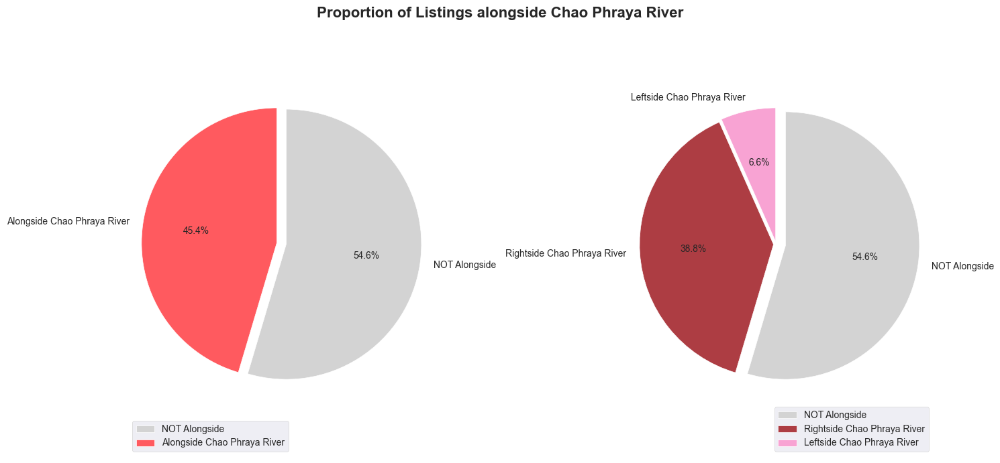

In [363]:
# Pie chart styling
chao_phraya_groupby = airbnb_cleaned['chao_phraya_pos'].value_counts().reset_index()
chao_phraya_side_groupby = airbnb_cleaned['chao_phraya_side'].value_counts().reset_index()

# plt.figure(figsize=(11,7))
fig, axes = plt.subplots(1, 2, figsize=(15,7))
fig.suptitle(
    'Proportion of Listings alongside Chao Phraya River', 
    size=16, fontweight='bold'
)

# plt.title('Proportion of Listings alongside Chao Phraya River')
axes[0].pie(
    x=chao_phraya_groupby['count'],
    labels=chao_phraya_groupby['chao_phraya_pos'],
    autopct='%.1f%%',
    startangle=90,
    counterclock=False,
    explode=[.07, 0],
    colors= ['#D3D3D3','#FF5A5F']
)
axes[0].legend(loc='lower left')
axes[0].axis('Equal')

axes[1].pie(
    x=chao_phraya_side_groupby['count'],
    labels=chao_phraya_side_groupby['chao_phraya_side'],
    autopct='%.1f%%',
    startangle=90,
    counterclock=False,
    explode=[.07, 0.02, 0.02],
    colors= ['#D3D3D3', '#AD3D43', '#F8A3D3']
)
axes[1].axis('Equal')
axes[1].legend(loc='lower right')

plt.tight_layout();

> Although neighbourhoods located alongside Chao Phraya river only about 34% of all neighbourhoods (17 out of 50), but the proportions say there are 45.4% listings (inside those Neighbourhoods) located alongside Chao Phraya River! <br> <br>
Moreover, it clearly seen that more of the Listings and Neighbourhoods located at the Right alongside Chao Phraya River (22% vs 12% and 38.8% vs 6.6%)! <br>
As expected, because the Leftside is more of the Old Town of Bangkok compared to the Rightside that is more of the New (Modern) Town of Bangkok.

## Room Type Spread Location across Chao Phraya River

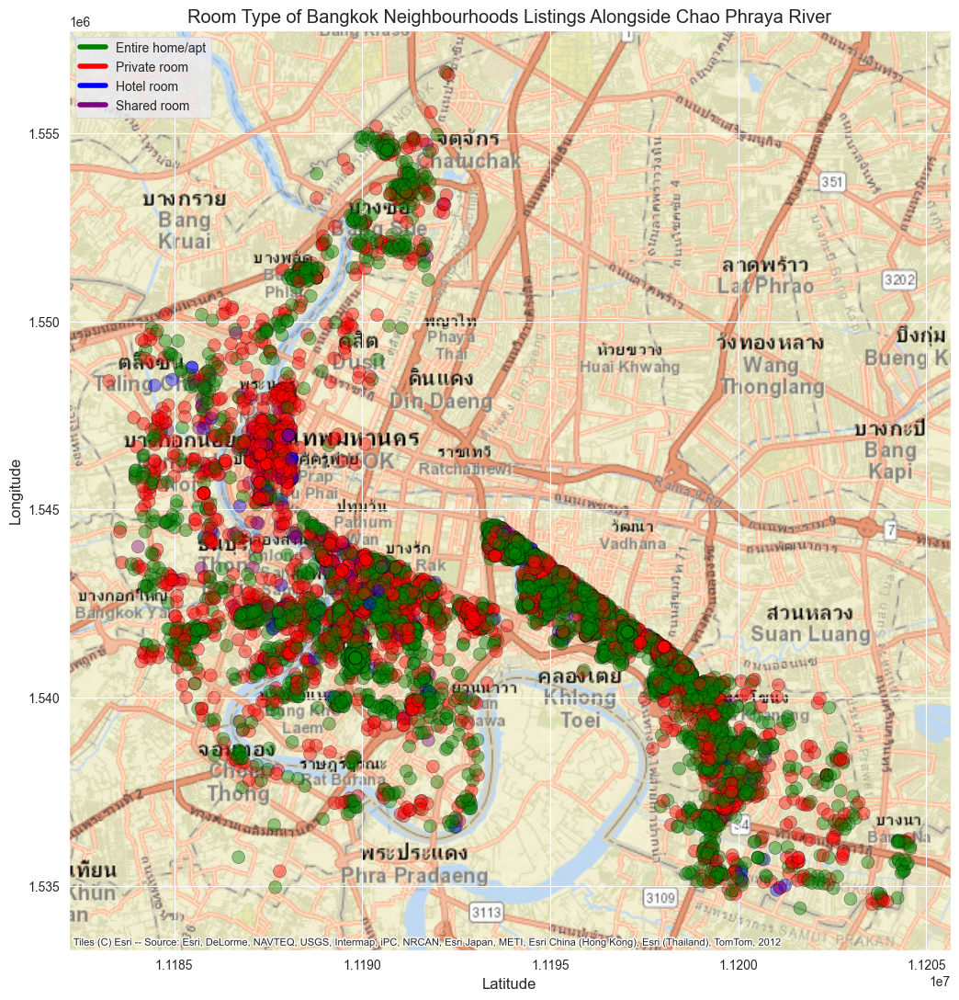

In [394]:
# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(filtered_nghb['longitude'], filtered_nghb['latitude'])]
gdf = gpd.GeoDataFrame(filtered_nghb[['neighbourhood', 'room_type', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry) # WGS 84 CRS

# Define a color map for the markers
color_map = {
    'Entire home/apt': 'green',
    'Private room': 'red',
    'Hotel room': 'blue',
    'Shared room': 'purple',
}

custom_lines = [Line2D([0], [0], color='green', lw=4),
                Line2D([0], [0], color='red', lw=4),
                Line2D([0], [0], color='blue', lw=4),
                Line2D([0], [0], color='purple', lw=4)]

# Map the colors to the data
gdf['color'] = gdf['room_type'].map(color_map)

# Set CRS to EPSG:3857 for compatibility with contextily basemaps
gdf = gdf.to_crs(epsg=3857)

# Plot the base map with contextily
fig, ax = plt.subplots(figsize=(17, 13))
gdf.plot(ax=ax, color=gdf['color'], markersize=100, alpha=0.4, edgecolor='k')

# Add the basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldStreetMap)

# Set titles and labels
ax.set_title('Room Type of Bangkok Neighbourhoods Listings Alongside Chao Phraya River')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.legend(custom_lines, color_map.keys(), loc="upper left")

# Show the plot
plt.show()

> The map shown that there is no specific `room_type` spread only one for every different position alongside Chao Phraya River!

## Map Location of Possible Outliers on `price` feature and NOT

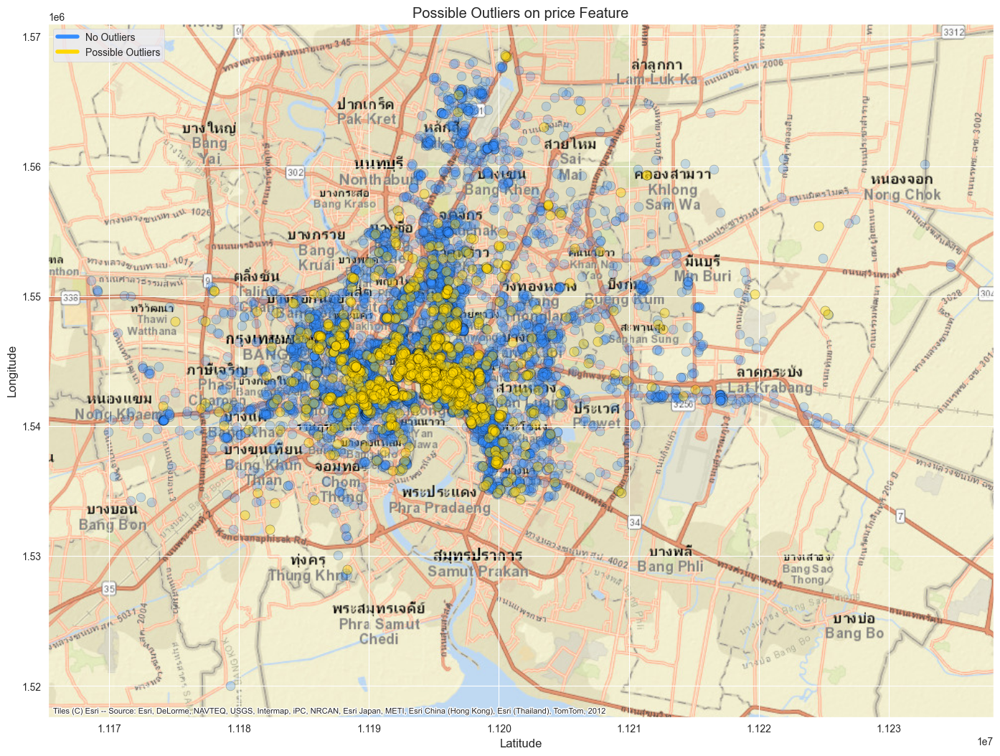

In [89]:
df_price_out = outliers_check(airbnb, 'price')

custom_lines = [Line2D([0], [0], color='#358EFF', lw=4),
                Line2D([0], [0], color='gold', lw=4)]

# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(no_out['longitude'], no_out['latitude'])]
gdf = gpd.GeoDataFrame(no_out[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry) # WGS 84 CRS

geo_out = [Point(xy) for xy in zip(df_price_out['longitude'], df_price_out['latitude'])]
gdf_out = gpd.GeoDataFrame(df_price_out[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geo_out) # WGS 84 CRS

# Set CRS to EPSG:3857 for compatibility with contextily basemaps
gdf = gdf.to_crs(epsg=3857)

# Plot the base map with contextily
fig, ax = plt.subplots(figsize=(17, 13))
gdf.plot(ax=ax, color='#358EFF', markersize=85, alpha=0.25, edgecolor='k')

# # Set CRS to EPSG:3857 for compatibility with contextily basemaps
# ldg = ldg.to_crs(epsg=3857)
# ldg.plot(ax=ax, color='blue', markersize=120, alpha=0.9, edgecolor='k')

gdf_out = gdf_out.to_crs(epsg=3857)
gdf_out.plot(ax=ax, color='gold', markersize=90, alpha=0.4, edgecolor='k')

# Add the basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldStreetMap)

# # Get the current extent
# xmin, xmax, ymin, ymax = gdf.total_bounds
# # print(xmin, xmax, ymin, ymax)
# # Set new extent to zoom out (adjusting by a factor, e.g., 1.5)
# scale_num = 2

# ax.set_xlim(xmin - scale_num, xmax + scale_num)
# ax.set_ylim(ymin - scale_num, ymax + scale_num)

# Set titles and labels
ax.set_title('Possible Outliers on price Feature')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.legend(custom_lines, ['No Outliers', 'Possible Outliers'], loc="upper left")

# Show the plot
plt.show()

> This map proves that the possible outliers (shown as gold) might be not the one, because the spread itself tend to be centered around the crowded area.

## Top Highlighted All Neighbourhoods Alongside Chao Phraya River

In [365]:
# Check the 75th Percentile (or Q3) - we should summarize the Top 12 then

Q3_75percentile = airbnb_cleaned['neighbourhood'].value_counts().reset_index()['count'].quantile(.75)
result[result['count'] > Q3_75percentile]

,neighbourhood,count
0,Vadhana,2151
1,Khlong Toei,2085
2,Huai Khwang,1122
3,Ratchathewi,1109
4,Bang Rak,823
5,Sathon,797
6,Phra Nakhon,617
7,Phra Khanong,552
8,Chatu Chak,546
9,Bang Na,458


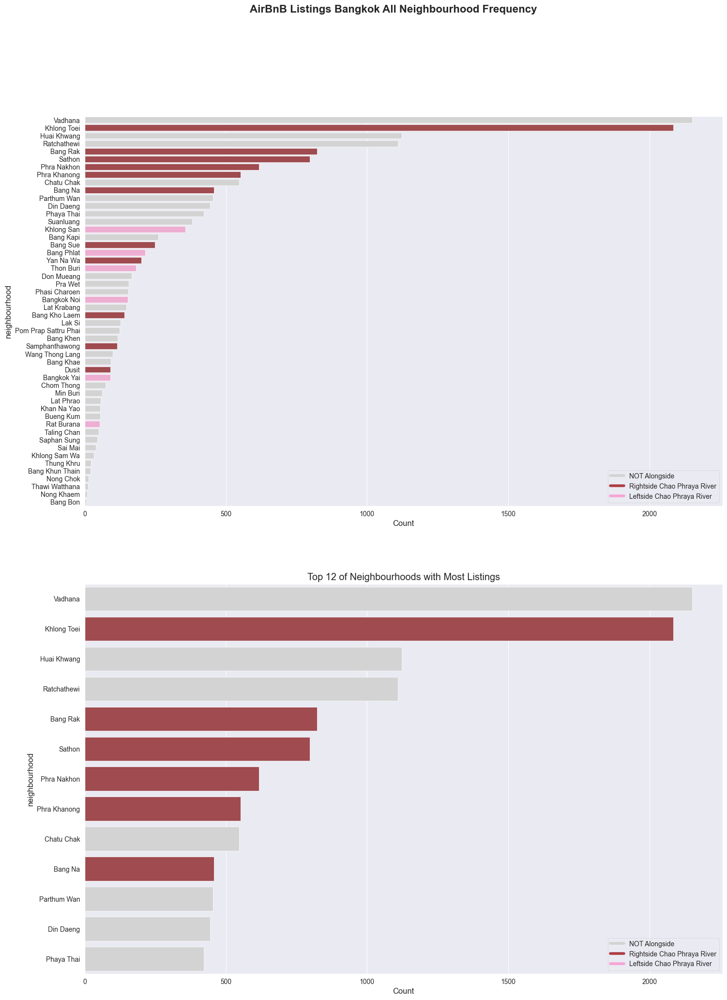

In [405]:
# Using barplot to show the neighbourhoods frequency sorted by the largest one

result = airbnb_cleaned['neighbourhood'].value_counts().reset_index()

fig, axes = plt.subplots(2, 1, figsize=(17, 23))
# plt.figure(figsize = (17, 13))
# plt.title('AirBnB Listings Bangkok All Neighbourhood Frequency')
fig.suptitle(
    'AirBnB Listings Bangkok All Neighbourhood Frequency', 
    size=16, fontweight='bold'
)

sns.barplot(
    data=result,
    y='neighbourhood',
    x='count',
    orient='horizontal',
    errorbar = None,
    # order = result['neighbourhood'],
    # estimator='count',
    palette = [
        '#AD3D43' if x in neighbour_chao_phraya_right_side else (
        '#F8A3D3' if x in neighbour_chao_phraya_left_side else 'lightgray'
    ) for x in result['neighbourhood']],
    hue='neighbourhood',
    ax = axes[0]
    )
axes[1].set_title('Sorted Neighbourhoods with Most Listings')
axes[0].set_xlabel('Count')

custom_lines = [
    Line2D([0], [0], color='lightgray', lw=4),
    Line2D([0], [0], color='#AD3D43', lw=4),
    Line2D([0], [0], color='#F8A3D3', lw=4)
]

axes[0].legend(custom_lines, airbnb_cleaned.chao_phraya_side.unique())

result_filtered = result[result['count'] > Q3_75percentile]

axb = sns.barplot(
    data=result_filtered,
    y='neighbourhood',
    x='count',
    orient='horizontal',
    errorbar = None,
    palette = [
        '#AD3D43' if x in neighbour_chao_phraya_right_side else (
        '#F8A3D3' if x in neighbour_chao_phraya_left_side else 'lightgray'
    ) for x in result_filtered['neighbourhood']],
    hue='neighbourhood',
    ax = axes[1]
    )
axes[1].set_title('Top 12 of Neighbourhoods with Most Listings')
axes[1].set_xlabel('Count')
axes[1].legend(custom_lines, airbnb_cleaned.chao_phraya_side.unique())

# # use to show label of count value
# for p in axb.patches:
#     axb.annotate(str(int(p.get_width())), (p.get_y() *2, p.get_width()  * 1.08));
# plt.tight_layout();

> From the bar chart above we see that there are 6 neighbourhoods alongside Chao Phraya river which reside on the Top 12 of most Listings Frequency (> 75th Percentile), ALL of these located on the Rightside of Chao Phraya River! <br>
* Khlong Toei.
* Bang Rak.
* Sathon.
* Phra Nakhon.
* Phra Khanong.
* Bang Na.

## Neighbourhood Frequency Alongside Chao Phraya and The Rest Location

[.](https://lazudi.com/th-en/blog/a-guide-to-living-on-the-chao-phraya-river-bangkok) <br>
[.](https://fullsuitcase.com/bangkok-neighborhoods-where-to-stay/) <br>
[.](https://www.nationalgeographic.com/travel/article/bangkok-rediscovers-the-magic-of-its-legendary-river)

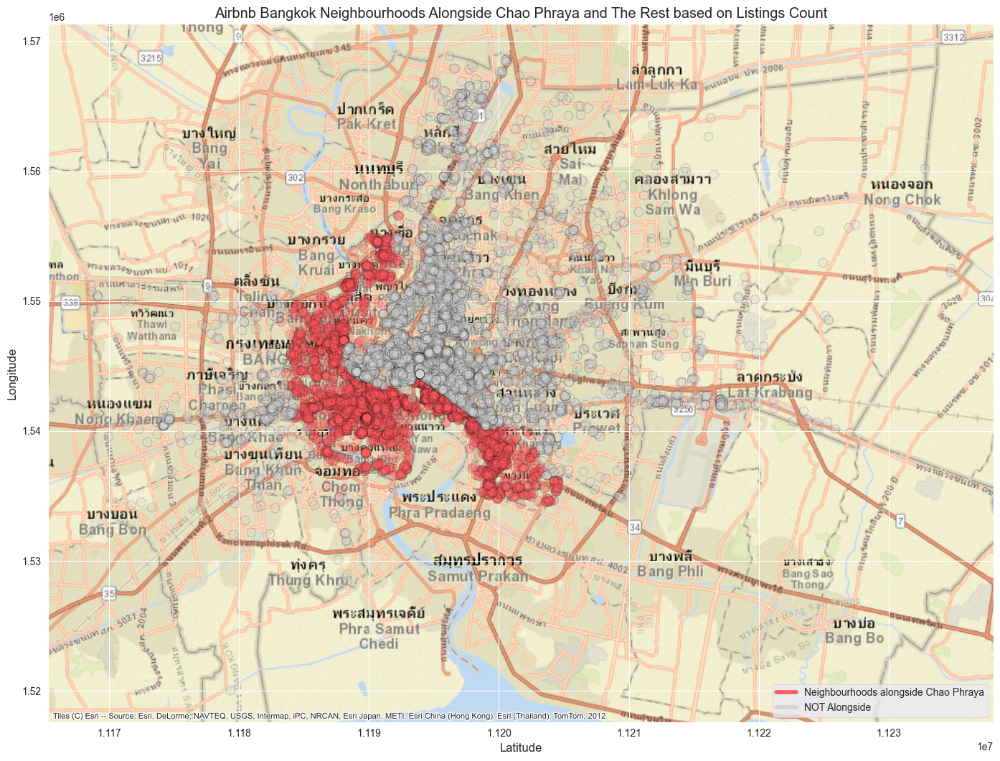

In [374]:
filtered_nghb = airbnb_cleaned[airbnb_cleaned['chao_phraya_pos'] != 'NOT Alongside'].reset_index(drop=True)
filtered_nghb2 = airbnb_cleaned[airbnb_cleaned['chao_phraya_pos'] == 'NOT Alongside'].reset_index(drop=True)

# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(filtered_nghb['longitude'], filtered_nghb['latitude'])]
gdf = gpd.GeoDataFrame(filtered_nghb[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry) # WGS 84 CRS

# Create a GeoDataFrame
geometry2 = [Point(xy) for xy in zip(filtered_nghb2['longitude'], filtered_nghb2['latitude'])]
gdf2 = gpd.GeoDataFrame(filtered_nghb2[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry2) # WGS 84 CRS

# Define a color map for the markers
# color_map = {
#     'Vadhana': 'purple',
#     'Khlong Toei': 'green',
#     'Huai Khwang': 'blue',
#     'Ratchathewi': 'red',
#     'Bang Rak': 'orange',
#     'Sathon': 'gold'
# }

color_map = dict()

for k in airbnb_cleaned['neighbourhood'].unique():
    cek_along_pos = airbnb_cleaned[airbnb_cleaned['neighbourhood'] == k]['chao_phraya_pos'].iloc[0]
    if cek_along_pos == 'NOT Alongside':
        color_map[k] = 'lightgray'
    else:
        color_map[k] = '#FF5A5F'

custom_lines = [Line2D([0], [0], color='#FF5A5F', lw=4),
                Line2D([0], [0], color='lightgray', lw=4)]

# custom_lines.extend([Line2D([0], [0], color='orange', lw=4)] * (len(color_map) - 5))

# Map the colors to the data
# gdf['color'] = gdf['neighbourhood'].map(color_map)

# Set CRS to EPSG:3857 for compatibility with contextily basemaps
gdf = gdf.to_crs(epsg=3857)
gdf2 = gdf2.to_crs(epsg=3857)

# Plot the base map with contextily
fig, ax = plt.subplots(figsize=(17, 13))
# gdf.plot(ax=ax, color=gdf['color'], markersize=85, alpha=0.25, edgecolor='k')
gdf.plot(ax=ax, c='#FF5A5F', markersize=85, alpha=0.25, edgecolor='k')
gdf2.plot(ax=ax, c='lightgray', markersize=85, alpha=0.25, edgecolor='k')

# # Add labels for each neighborhood
# for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf['neighbourhood']):
#     ax.text(x, y, label, fontsize=12, ha='right')

# Add the basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldStreetMap)

# # Get the current extent
# xmin, xmax, ymin, ymax = gdf.total_bounds
# # print(xmin, xmax, ymin, ymax)
# # Set new extent to zoom out (adjusting by a factor, e.g., 1.5)
# scale_num = 2

# ax.set_xlim(xmin - scale_num, xmax + scale_num)
# ax.set_ylim(ymin - scale_num, ymax + scale_num)

# Set titles and labels
ax.set_title('Airbnb Bangkok Neighbourhoods Alongside Chao Phraya and The Rest based on Listings Count')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.legend(custom_lines, ['Neighbourhoods alongside Chao Phraya', 'NOT Alongside'], loc='lower right')
# ax.legend(loc="upper left")
# ax.set_axis_off()

# Show the plot
plt.show()

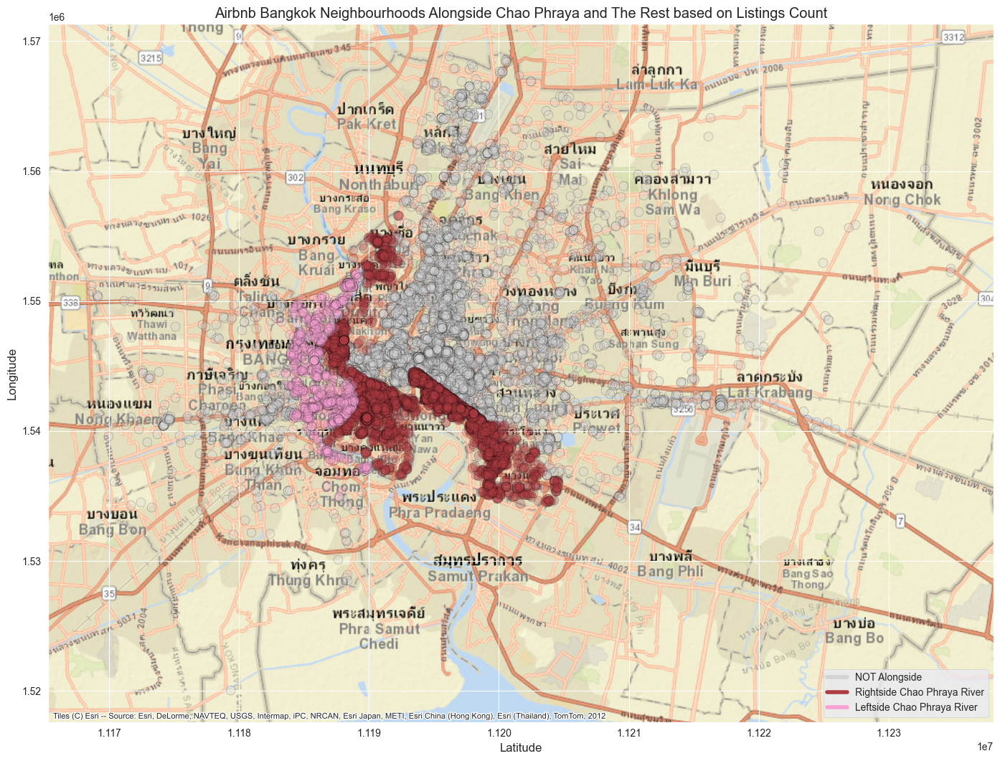

In [375]:
filtered_nghh_not = airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'NOT Alongside'].reset_index(drop=True)
filtered_nghb_left= airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'Leftside Chao Phraya River'].reset_index(drop=True)
filtered_nghb_right= airbnb_cleaned[airbnb_cleaned['chao_phraya_side'] == 'Rightside Chao Phraya River'].reset_index(drop=True)

# Create a GeoDataFrame for NOT Alongside Chao Phraya
geometry_not = [Point(xy) for xy in zip(filtered_nghh_not['longitude'], filtered_nghh_not['latitude'])]
gdf_not = gpd.GeoDataFrame(filtered_nghh_not[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry_not) # WGS 84 CRS

# Create a GeoDataFrame for Leftside Chao Phraya
geometry_left = [Point(xy) for xy in zip(filtered_nghb_left['longitude'], filtered_nghb_left['latitude'])]
gdf_left = gpd.GeoDataFrame(filtered_nghb_left[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry_left) # WGS 84 CRS

# Create a GeoDataFrame for Rightside Chao Phraya
geometry_right = [Point(xy) for xy in zip(filtered_nghb_right['longitude'], filtered_nghb_right['latitude'])]
gdf_right = gpd.GeoDataFrame(filtered_nghb_right[['neighbourhood', 'latitude', 'longitude']], crs="EPSG:4326", geometry=geometry_right) # WGS 84 CRS

color_map = dict()

for k in airbnb_cleaned['neighbourhood'].unique():
    cek_along_side = airbnb_cleaned[airbnb_cleaned['neighbourhood'] == k]['chao_phraya_side'].iloc[0]
    if cek_along_side == 'NOT Alongside':
        color_map[k] = 'lightgray'
    elif cek_along_side == 'Leftside Chao Phraya River':
        color_map[k] = '#F8A3D3'
    elif cek_along_side == 'Rightside Chao Phraya River':
        color_map[k] = '#AD3D43'

custom_lines = [
    Line2D([0], [0], color='lightgray', lw=4),
    Line2D([0], [0], color='#AD3D43', lw=4),
    Line2D([0], [0], color='#F8A3D3', lw=4)
]

# custom_lines.extend([Line2D([0], [0], color='orange', lw=4)] * (len(color_map) - 5))

# Map the colors to the data
# gdf['color'] = gdf['neighbourhood'].map(color_map)

# Set CRS to EPSG:3857 for compatibility with contextily basemaps
gdf_not = gdf_not.to_crs(epsg=3857)
gdf_left = gdf_left.to_crs(epsg=3857)
gdf_right = gdf_right.to_crs(epsg=3857)

# Plot the base map with contextily
fig, ax = plt.subplots(figsize=(17, 13))
# gdf.plot(ax=ax, color=gdf['color'], markersize=85, alpha=0.25, edgecolor='k')
gdf_not.plot(ax=ax, c='lightgray', markersize=85, alpha=0.25, edgecolor='k')
gdf_right.plot(ax=ax, c='#AD3D43', markersize=85, alpha=0.25, edgecolor='k')
gdf_left.plot(ax=ax, c='#F8A3D3', markersize=85, alpha=0.25, edgecolor='k')

# Add the basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldStreetMap)

# Set titles and labels
ax.set_title('Airbnb Bangkok Neighbourhoods Alongside Chao Phraya and The Rest based on Listings Count')
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.legend(custom_lines, airbnb_cleaned.chao_phraya_side.unique(), loc='lower right')
# ax.legend(loc="upper left")
# ax.set_axis_off()

# Show the plot
plt.show()

> This chart show where is the location of Neighbourhoods that alongside the Chao Phraya river (highlighted in Dark Red and Pink). It clearly shows that the density based on listings counts tend to be located on the Right-side of Chao Phraya River rather than the Left-side of it.

## Total Listings of Each Location Chao Phraya River based on `room_type`

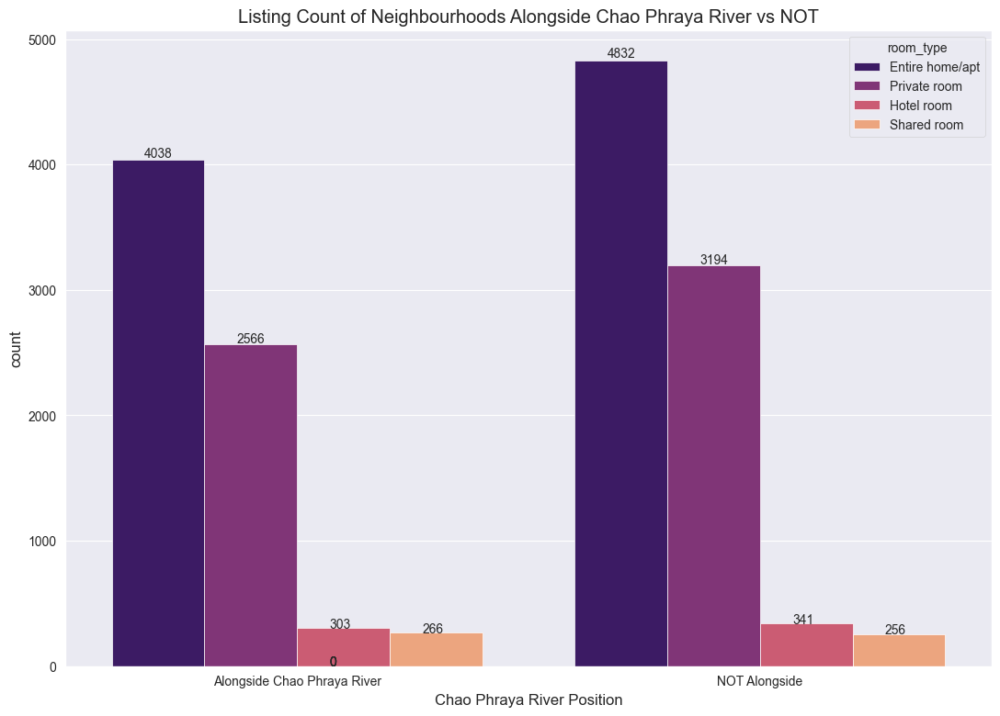

In [381]:
plt.figure(figsize=(13,9))
plt.title('Listing Count of Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_pos',
    data=airbnb_cleaned, 
    palette='magma',
    hue='room_type',
    stat='count',
    order=['Alongside Chao Phraya River', 'NOT Alongside']
)
# plt.xticks(ticks=[0,1],labels=['Alongside Chao Phraya River', 'NOT Alongside'])
plt.xlabel('Chao Phraya River Position')

# use to show label of count value
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.07, p.get_height() * 1.005));

> Based on this comparison, the ones located alongside Chao Phraya river or NOT have no different proportion of `room_type` which started from the most to the least: Entire home/apt, Private room, Hotel room, & Shared room.

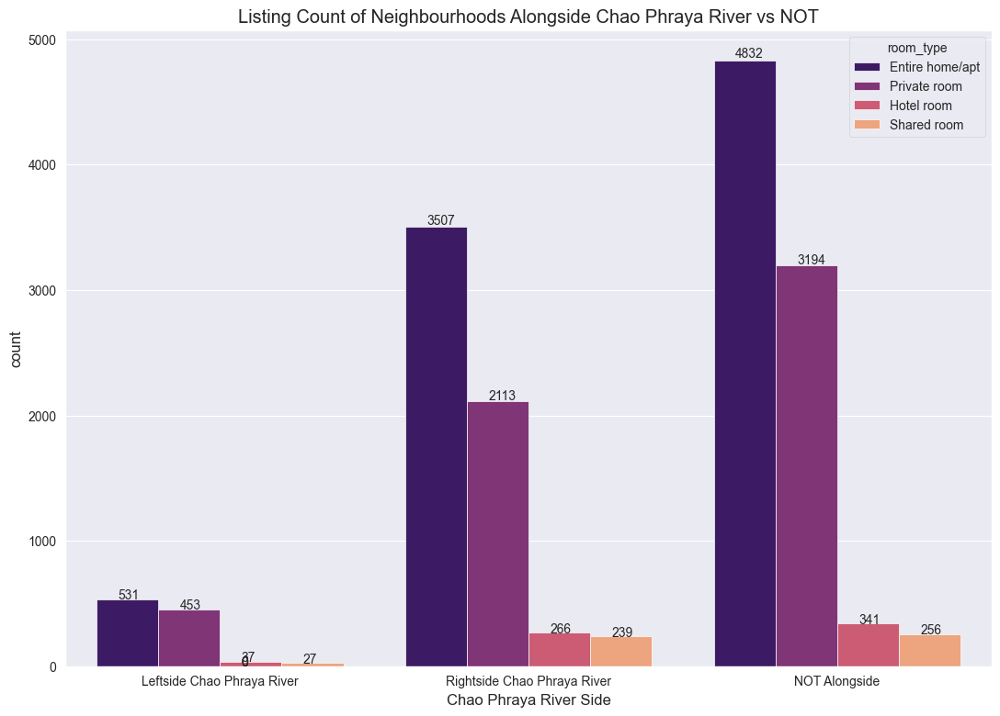

In [380]:
plt.figure(figsize=(13,9))
plt.title('Listing Count of Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_side',
    data=airbnb_cleaned, 
    palette='magma',
    hue='room_type',
    stat='count',
    order=['Leftside Chao Phraya River', 'Rightside Chao Phraya River', 'NOT Alongside']
)
# plt.xticks(ticks=[0,1],labels=['Alongside Chao Phraya River', 'NOT Alongside'])
plt.xlabel('Chao Phraya River Side')

# use to show label of count value
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.07, p.get_height() * 1.005));

> More detailed comparison, the ones located alongside Chao Phraya river on its Rightside tend to have more **Entire home/apt** `room_type` compared to the **Private room** (3507:2113 or about 1.66:1), as for the Leftside tend to have same pattern but with a slightly different ratio between these two `room_type` (531:453 or about 1.17:1).

## Average of `price` Comparison for Listings on Neighbourhoods Alongside Chao Phraya River and The Rest (NOT Alongside) based on `room_type`

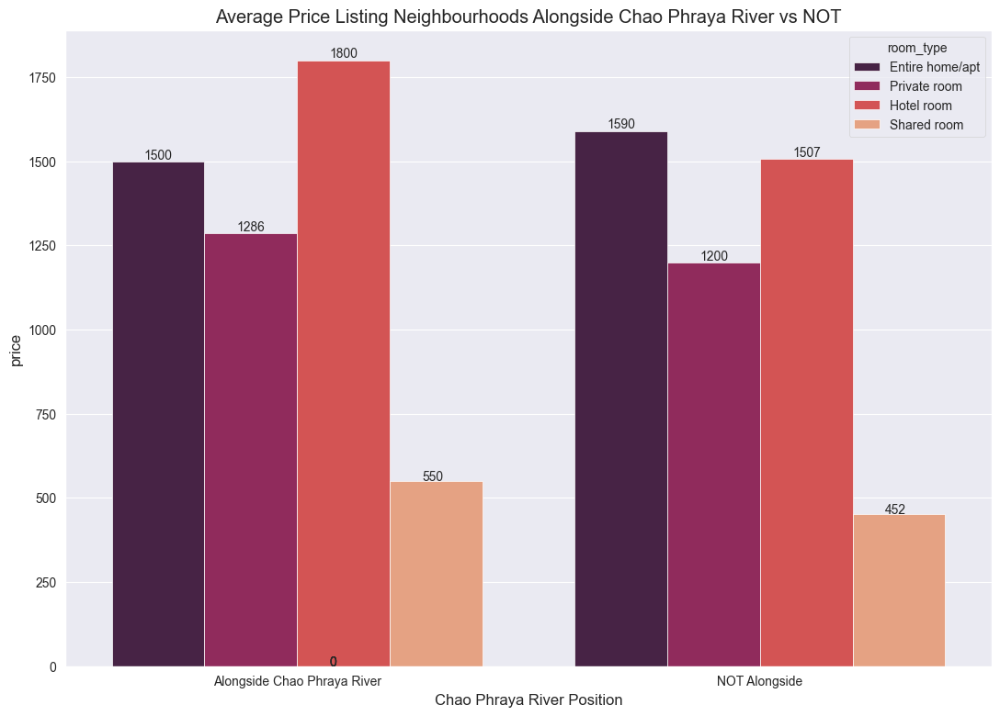

In [136]:
plt.figure(figsize=(13,9))
plt.title('Average Price Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.barplot(
    x='chao_phraya_pos',
    y='price', 
    data=airbnb_cleaned, 
    palette='rocket',
    hue='room_type',
    errorbar=None,
    estimator='median',
    order=['Alongside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Position')

# use to show the label of mean value
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.07, p.get_height() * 1.005));

> Based on this comparison, the ones located alongside Chao Phraya river `room_type` with the highest Average Price for each night is **Hotel Room**; and the ones NOT alongside `room_type` with the highest Average Price for each night surprisingly is **Entire home/apt** with slightly different than Hotel Room.

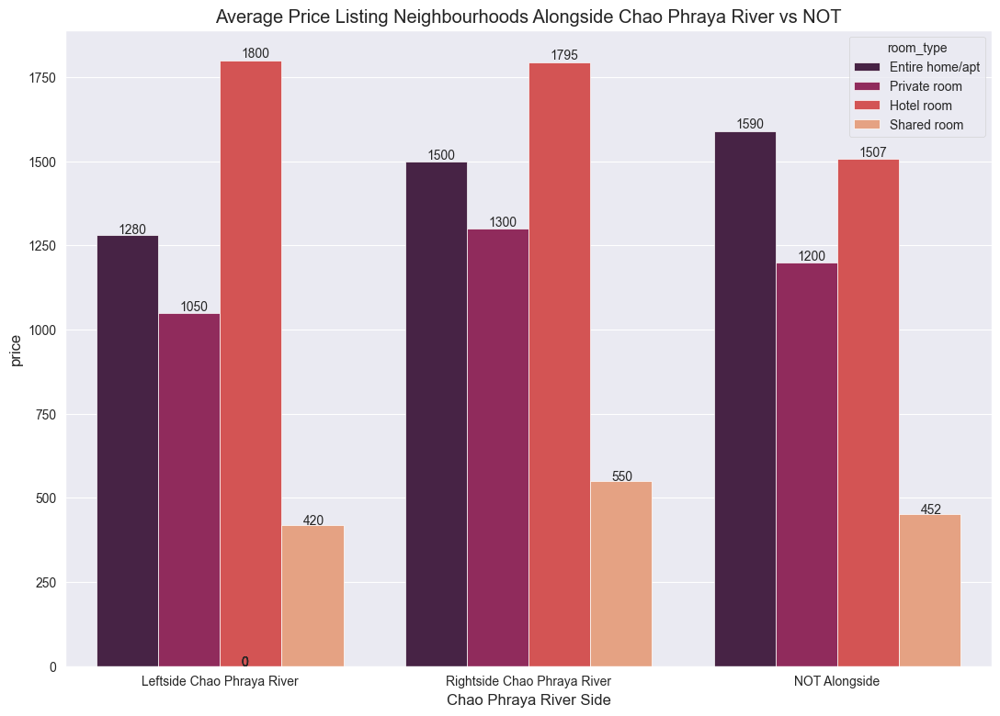

In [383]:
plt.figure(figsize=(13,9))
plt.title('Average Price Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.barplot(
    x='chao_phraya_side',
    y='price', 
    data=airbnb_cleaned, 
    palette='rocket',
    hue='room_type',
    errorbar=None,
    estimator='median',
    order=['Leftside Chao Phraya River', 'Rightside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Side')

# use to show the label of mean value
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.07, p.get_height() * 1.005));

> More detailed comparison, from the graph shows that for each either on the Righside or Leftside {(alongside) Chao Phraya River}, the `Average Price` still show the same ordered of `room_type` from the most expensive to the least (per night):  **Hotel room, Entire home/apt, Private room, & Shared room**.

## Frequency of `minimum_nights` Comparison for Listings on Neighbourhoods Alongside Chao Phraya River and The Rest (NOT Alongside)

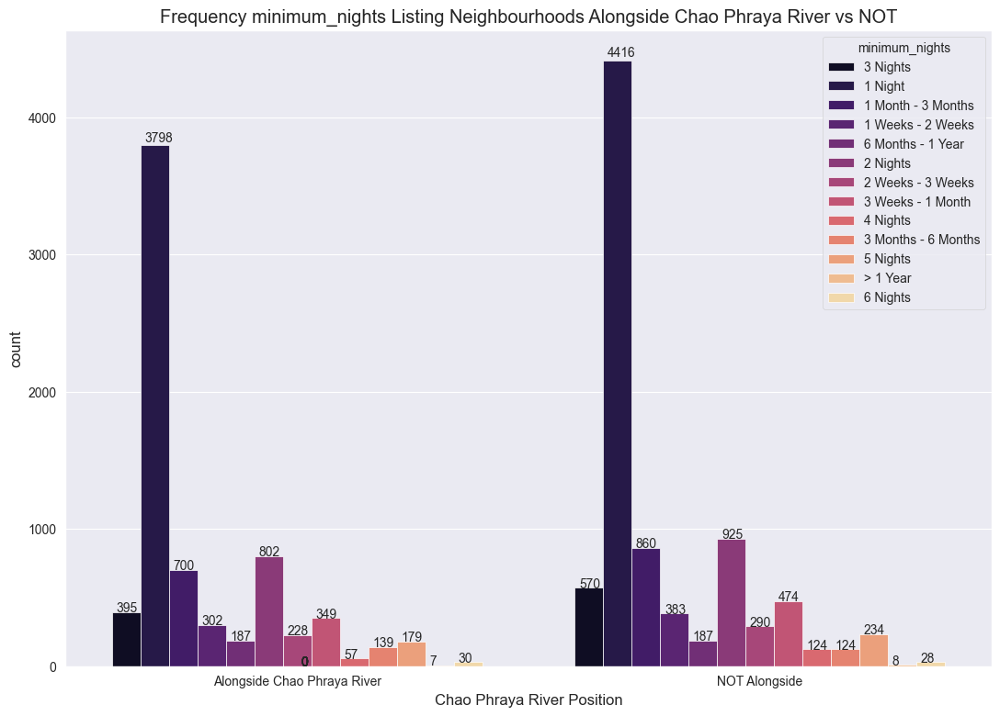

In [39]:
plt.figure(figsize=(13,9))
plt.title('Frequency minimum_nights Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_pos',
    data=airbnb_cleaned, 
    palette='magma',
    hue='minimum_nights',
    stat='count',
    order=['Alongside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Position')

for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.009, p.get_height() * 1.006));

In [34]:
# Top minimun_nights based on the most one that appeared!

min_night_chao_phraya_pos_groupby = airbnb_cleaned.groupby('chao_phraya_pos')['minimum_nights'].value_counts().sort_values(ascending=False).reset_index()
display(
    min_night_chao_phraya_pos_groupby[min_night_chao_phraya_pos_groupby['chao_phraya_pos'] == 'NOT Alongside'].iloc[0],
    min_night_chao_phraya_pos_groupby[min_night_chao_phraya_pos_groupby['chao_phraya_pos'] == 'Alongside Chao Phraya River'].iloc[0]
)

chao_phraya_pos    NOT Alongside
minimum_nights           1 Night
count                       4416
Name: 0, dtype: object

chao_phraya_pos    Alongside Chao Phraya River
minimum_nights                         1 Night
count                                     3798
Name: 1, dtype: object

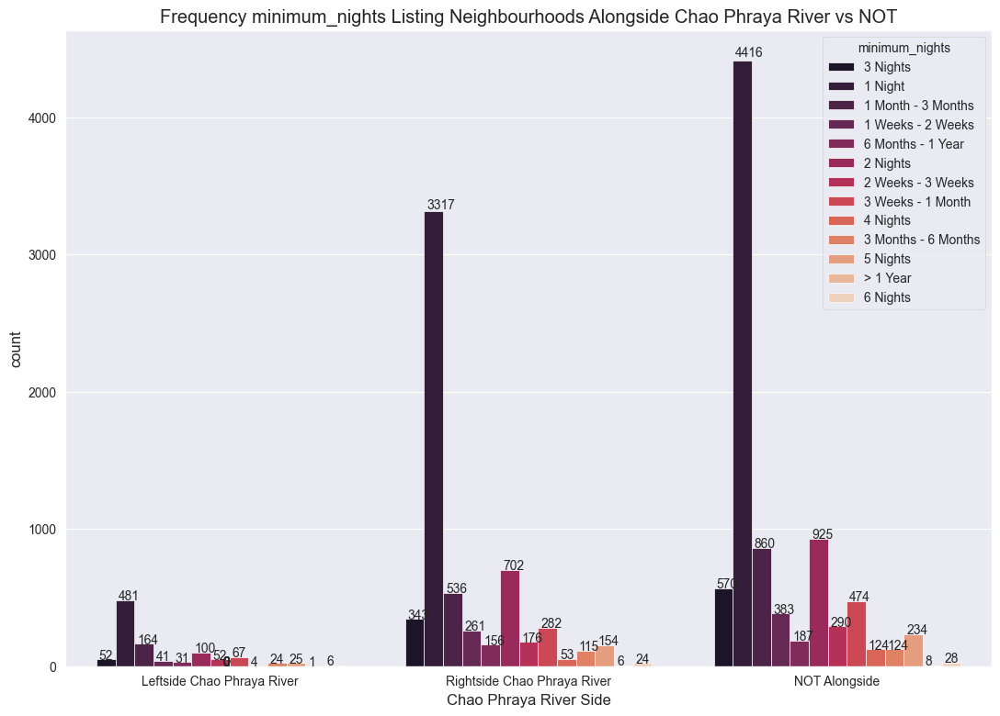

In [40]:
plt.figure(figsize=(13,9))
plt.title('Frequency minimum_nights Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_side',
    data=airbnb_cleaned, 
    palette='rocket',
    hue='minimum_nights',
    stat='count',
    order=['Leftside Chao Phraya River', 'Rightside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Side')

for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.009, p.get_height() * 1.006));

In [36]:
# Top minimun_nights based on the most one that appeared!

min_night_chao_phraya_side_groupby = airbnb_cleaned.groupby('chao_phraya_side')['minimum_nights'].value_counts().sort_values(ascending=False).reset_index()
display(
    min_night_chao_phraya_side_groupby[min_night_chao_phraya_side_groupby['chao_phraya_side'] == 'NOT Alongside'].iloc[0],
    min_night_chao_phraya_side_groupby[min_night_chao_phraya_side_groupby['chao_phraya_side'] == 'Rightside Chao Phraya River'].iloc[0],
    min_night_chao_phraya_side_groupby[min_night_chao_phraya_side_groupby['chao_phraya_side'] == 'Leftside Chao Phraya River'].iloc[0]
)

chao_phraya_side    NOT Alongside
minimum_nights            1 Night
count                        4416
Name: 0, dtype: object

chao_phraya_side    Rightside Chao Phraya River
minimum_nights                          1 Night
count                                      3317
Name: 1, dtype: object

chao_phraya_side    Leftside Chao Phraya River
minimum_nights                         1 Night
count                                      481
Name: 7, dtype: object

> Based on this comparison, both of all located either on the Rightside or Leftside or even NOT alongside Chao Phraya River, all of `minimum_nights` mostly is 1 night.

## Frequency of `availability_365` for each alongside Chao Phraya River and NOT

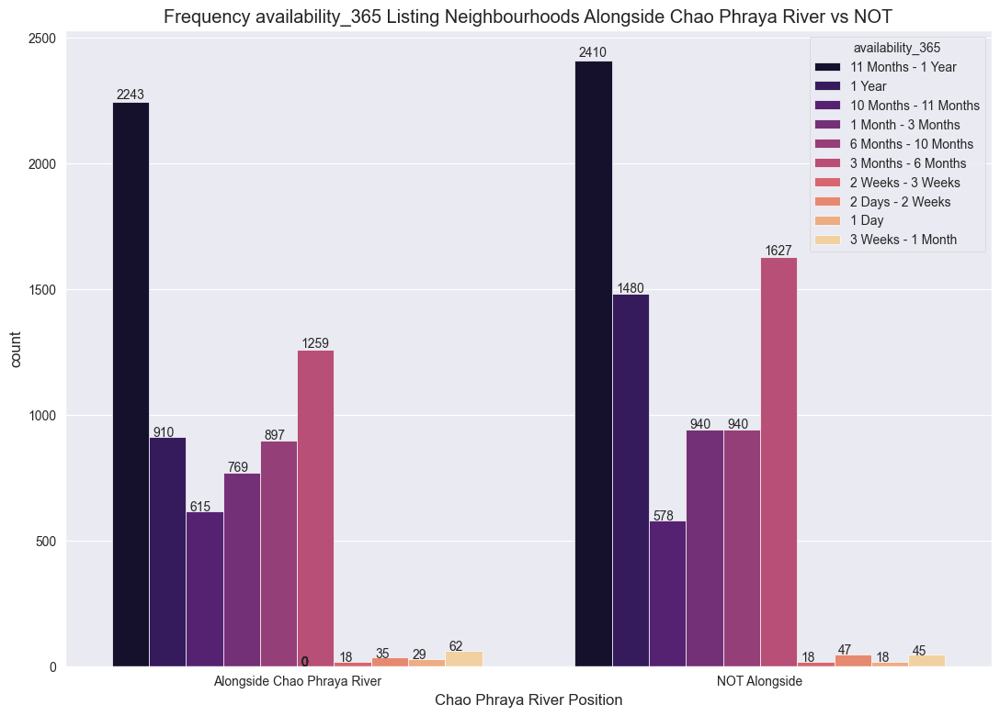

In [41]:
plt.figure(figsize=(13,9))
plt.title('Frequency availability_365 Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_pos',
    data=airbnb_cleaned, 
    palette='magma',
    hue='availability_365',
    stat='count',
    order=['Alongside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Position')

for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.009, p.get_height() * 1.006));

In [38]:
# Top availability_365 based on the most one that appeared!

avail_365_chao_phraya_pos_groupby = airbnb_cleaned.groupby('chao_phraya_pos')['availability_365'].value_counts().sort_values(ascending=False).reset_index()
display(
    avail_365_chao_phraya_pos_groupby[avail_365_chao_phraya_pos_groupby['chao_phraya_pos'] == 'NOT Alongside'].iloc[0],
    avail_365_chao_phraya_pos_groupby[avail_365_chao_phraya_pos_groupby['chao_phraya_pos'] == 'Alongside Chao Phraya River'].iloc[0]
)

chao_phraya_pos          NOT Alongside
availability_365    11 Months - 1 Year
count                             2410
Name: 0, dtype: object

chao_phraya_pos     Alongside Chao Phraya River
availability_365             11 Months - 1 Year
count                                      2243
Name: 1, dtype: object

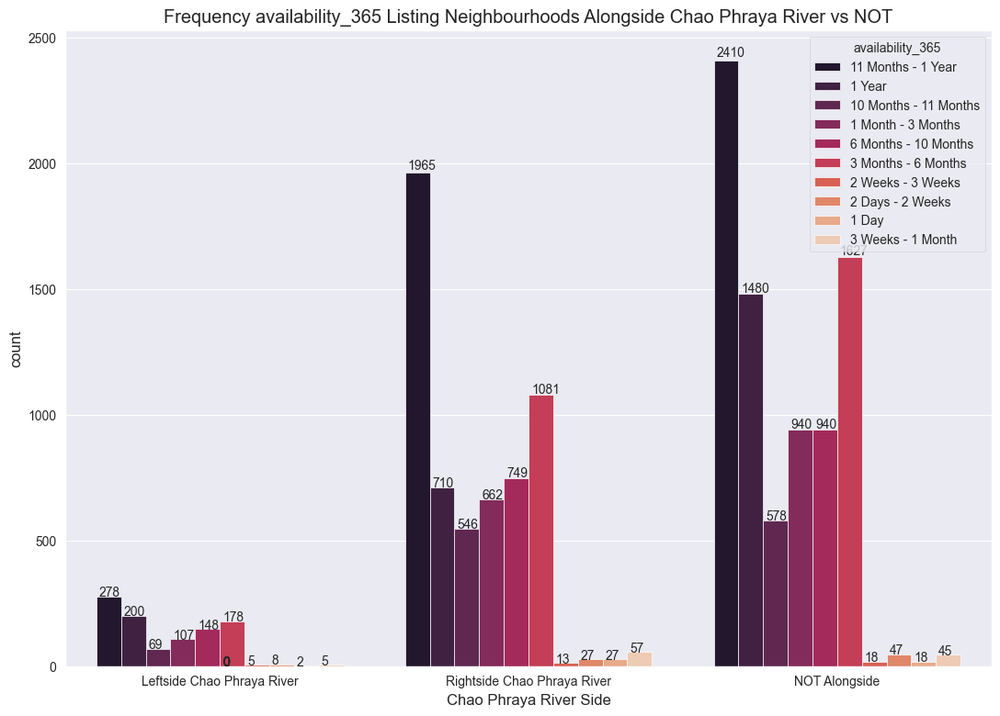

In [42]:
plt.figure(figsize=(13,9))
plt.title('Frequency availability_365 Listing Neighbourhoods Alongside Chao Phraya River vs NOT')
ax = sns.countplot(
    x='chao_phraya_side',
    data=airbnb_cleaned, 
    palette='rocket',
    hue='availability_365',
    stat='count',
    order=['Leftside Chao Phraya River', 'Rightside Chao Phraya River', 'NOT Alongside']
)

plt.xlabel('Chao Phraya River Side')

for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + 0.009, p.get_height() * 1.006));

In [37]:
# Top availability_365 based on the most one that appeared!

avail_365_chao_phraya_side_groupby = airbnb_cleaned.groupby('chao_phraya_side')['availability_365'].value_counts().sort_values(ascending=False).reset_index()
display(
    avail_365_chao_phraya_side_groupby[avail_365_chao_phraya_side_groupby['chao_phraya_side'] == 'NOT Alongside'].iloc[0],
    avail_365_chao_phraya_side_groupby[avail_365_chao_phraya_side_groupby['chao_phraya_side'] == 'Rightside Chao Phraya River'].iloc[0],
    avail_365_chao_phraya_side_groupby[avail_365_chao_phraya_side_groupby['chao_phraya_side'] == 'Leftside Chao Phraya River'].iloc[0]
)

chao_phraya_side         NOT Alongside
availability_365    11 Months - 1 Year
count                             2410
Name: 0, dtype: object

chao_phraya_side    Rightside Chao Phraya River
availability_365             11 Months - 1 Year
count                                      1965
Name: 1, dtype: object

chao_phraya_side    Leftside Chao Phraya River
availability_365            11 Months - 1 Year
count                                      278
Name: 12, dtype: object

> Based on this comparison, both of all located either on the Rightside or Leftside or NOT alongside Chao Phraya River, all of `availability_365` values mostly  is 11 Months - 1 Year.

# 5. Summary

Looking at the results of the analysis, although the areas around the Chao Phraya river are only 17 out of a total of 50 areas (with 11 on the right side, and the remaining 6 on the left side), these areas are comparable from several aspects, both in terms of price, number of nights, and availability. It is also noticeable that the distribution of listings in the area along the Chao Phraya river is not very even (in the sense that there are a lot of empty areas, although there may be buildings or other places). Given its strategic location, especially in terms of direct and indirect access via transportation to several landmarks, then the advantage of the river view, as well as the right area having many listings in the neighbourhoods rivaling those of the highest areas; then an increase in the number of new listings could be considered along this area for Airbnb in the future.

# Recommendation

For additional measures that take into account the proximity to Bangkok's landmarks, this can also be accompanied by not only the division of large areas (the left side of what can be called the old city part of Bangkok, with the right side of what can be called the new (modern) city part of Bangkok) along the Chao Phraya River and not, but can be subdivided into other related categories (such as the presence of areas near the city center such as shopping or business center areas). For the main focus, we can look more at the area along the Chao Phraya river on the left side which seems to have very few listings, this can be further explored in the future. That way the growth in the number of listings, will be able to increase up to 20% every year, of course accompanied by an influx of tourists, until finally it can also have an impact on Airbnb Ban's profits.

---

<center><p font-size: 12px;> Thank You </p></center>

---